In [108]:
using DifferentialEquations
using LinearAlgebra
using Combinatorics
using SymEngine
using NLsolve
using Plots
using PlotlyJS
using Tullio
import Statistics
using FastDifferentiation
using Random
# using JLD2
using Symbolics
using  BenchmarkTools


In [109]:
function get_norm(T, g)
    """
    T should have configuration either 'u' or 'uu'
    """
    if ndims(T) == 2
        # @tensor begin
        @tullio D[] := g[u, a] * g[v, b] * T[a, b] * T[u, v]
        # end
        # return ein"(ua,vb,ab),uv->"(g,T,T)
        return D[1]
    else
        # @tensor begin
        @tullio D[] := g[a, b] * T[b] * T[a]
        # end
        # return ein"(ab,b),a->"(g,T,T)
        return D[1]
    end
end

get_norm (generic function with 1 method)

In [110]:
function levi_civita_symbol(dim=4)
    arr = zeros(Int, tuple(fill(dim, dim)...))
    for x in permutations(1:dim)
        mat = zeros(Int, (dim, dim))
        for (i, j) in enumerate(x)
            mat[i, j] = 1
        end
        arr[x...] = det(mat)
    end
    return arr
end

levi_civita_symbol (generic function with 2 methods)

In [111]:
function levi_civita_tensor(gk)
    epsu = levi_civita_symbol()
    det_g = det(gk)
    return epsu / sqrt(-(det_g))
end

levi_civita_tensor (generic function with 1 method)

In [112]:
function cov_metric_tensor(r, theta, a, M=1.0)
    """
    Define the metric tensor function.

    Parameters:
        a (float): Parameter 'a' in the metric.
        r (float): Parameter 'r' in the metric.
        theta (float): Parameter 'theta' in the metric.

    Returns:
        ndarray: The metric tensor at the given values of a, r, and theta/pi.
        Configuration: ll
    """
    #! Correction Added Mass term in the symbols 
    g = zeros((4, 4))

    Delta = a^2 - 2 * M * r + r^2
    Sigma = r^2 + a^2 * cos(theta)^2

    g[1, 1] = -(1.0 - 2.0 * M * r / Sigma)
    g[2, 2] = Sigma / Delta
    g[3, 3] = Sigma
    g[4, 4] = sin(theta)^2 * ((r^2 + a^2)^2 - Delta * a^2 * sin(theta)^2) / Sigma
    g[1, 4] = -2.0 * a * M * r * sin(theta)^2 / Sigma
    g[4, 1] = g[1, 4]

    return g
end


cov_metric_tensor (generic function with 2 methods)

In [113]:
function cot_metric_tensor(r, theta, a, M=1.0)
    """
    Define the metric tensor function.

    Parameters:
        a (float): Parameter 'a' in the metric.
        r (float): Parameter 'r' in the metric.
        theta (float): Parameter 'theta' in the metric.

    Returns:
        ndarray: The metric tensor at the given values of a, r, and theta.
        Configuration: uu
    """
    Delta = a^2 - 2 * M * r + r^2
    Sigma = r^2 + a^2 * cos(theta)^2

    denom = Delta * sin(theta)^2

    g = zeros((4, 4))
    g[1, 1] = -(sin(theta)^2 * ((r^2 + a^2)^2 - Delta * a^2 * sin(theta)^2) / Sigma) / denom

    g[2, 2] = Delta / Sigma

    g[3, 3] = 1.0 / Sigma

    # g[3, 3] = -(-(1.0 - 2.0 * r / Sigma)) / denom
    #! Corrected the g[3,3] term below
    g[4, 4] = (Delta - a^2 * sin(theta)^2) / (denom * Sigma)

    g[1, 4] = (-2.0 * a * M * r * sin(theta)^2 / Sigma) / denom

    g[4, 1] = g[1, 4]

    return g

end

cot_metric_tensor (generic function with 2 methods)

In [114]:
function kerr_christoffel(r, theta, a, M=1)
    """
    Function to give the Christoffel symbols for the Kerr metric.
    The Christoffel symbols are given as Gamma ^i _{jk}

    From Reference Paper, Appendix
    Config: ull
    """

    cs = zeros((4, 4, 4))

    # Definitions
    Delta = a^2 - 2 * M * r + r^2
    Sigma = r^2 + a^2 * cos(theta)^2

    cs[4, 1, 2] = M * (2 * r^2 - Sigma) / (Delta * Sigma^2) * a
    cs[1, 1, 2] = M * (r^2 + a^2) * (r^2 - a^2 * cos(theta)^2) / (Sigma^2 * Delta)

    cs[4, 1, 3] = -2 * M * a * r * (cos(theta) / sin(theta)) / (Sigma^2)
    cs[1, 1, 3] = -2 * M * a^2 * r * sin(theta) * cos(theta) / Sigma^2

    cs[1, 2, 4] = (
        -M
        * a
        * (2 * r^2 * (r^2 + a^2) + Sigma * (r^2 - a^2))
        * sin(theta)^2
        /
        (Delta * Sigma^2)
    )

    cs[4, 2, 4] = (
        r * Sigma * (Sigma - 2 * M * r)
        -
        M * a^2 * (2 * r^2 - Sigma) * sin(theta)^2
    ) / (Delta * Sigma^2)

    cs[1, 3, 4] = M * a^3 * r * sin(theta)^2 * sin(2 * theta) / Sigma^2

    cs[4, 3, 4] = (cos(theta) / sin(theta)) * (Sigma^2 + 2 * M * a^2 * r * sin(theta)^2) / Sigma^2

    cs[2, 1, 1] = M * Delta * (2 * r^2 - Sigma) / Sigma^3

    cs[2, 1, 4] = -cs[2, 1, 1] * a * sin(theta)^2

    cs[3, 1, 1] = -M * a * r * sin(2 * theta) / Sigma^3 * a
    cs[3, 1, 4] = 2.0 * M * r * a * (r^2 + a^2) * sin(theta) * cos(theta) / Sigma^3

    cs[2, 2, 2] = r / Sigma + (M - r) / Delta

    cs[2, 3, 3] = -r * Delta / Sigma
    cs[3, 2, 3] = -cs[2, 3, 3] / Delta

    cs[2, 2, 3] = cs[3, 3, 3] = -(a^2) * sin(2 * theta) / (2 * Sigma)
    cs[3, 2, 2] = -cs[2, 2, 3] / Delta

    cs[2, 4, 4] = (
        -Delta
        * (r * Sigma^2 - M * a^2 * (2 * r^2 - Sigma) * sin(theta)^2)
        * sin(theta)^2
        /
        Sigma^3
    )

    cs[3, 4, 4] = (
        -(Delta * Sigma^2 + 2 * M * r * (r^2 + a^2)^2)
        *
        sin(2 * theta)
        /
        (2 * Sigma^3)
    )

    #By symmetry. https://mathworld.wolfram.com/ChristoffelSymboloftheSecondKind.html
    cs[1, 2, 1] = cs[1, 1, 2]
    cs[1, 3, 1] = cs[1, 1, 3]
    cs[1, 4, 2] = cs[1, 2, 4]
    cs[1, 4, 3] = cs[1, 3, 4]


    cs[2, 4, 1] = cs[2, 1, 4]
    cs[2, 3, 2] = cs[2, 2, 3]

    cs[3, 4, 1] = cs[3, 1, 4]
    cs[3, 3, 2] = cs[3, 2, 3]

    cs[4, 2, 1] = cs[4, 1, 2]
    cs[4, 3, 1] = cs[4, 1, 3]
    cs[4, 4, 2] = cs[4, 2, 4]
    cs[4, 4, 3] = cs[4, 3, 4]

    return cs + zeros((4, 4, 4))
end


kerr_christoffel (generic function with 2 methods)

In [115]:
function kerr_riemann_tensor(r, theta, a, M=1.0)
    # Define variables
    rijkl = zeros((4, 4, 4, 4))

    # Definitions
    Delta = a^2 - 2 * M * r + r^2
    Sigma = r^2 + a^2 * cos(theta)^2

    rijkl[1, 1, 1, 4] = (
        2.0 * M^2
        * sin(theta)^2
        * a
        * r^2
        * (r^2 - 3.0 * a^2 * cos(theta)^2)
        /
        Sigma^4
    )

    rijkl[1, 1, 2, 3] = (
        -2.0 * M^2
        * (3.0 * r^2 - a^2 * cos(theta)^2)
        * r
        * cos(theta)
        * a^2
        * sin(theta)
        /
        (Sigma^3 * Delta)
    )

    rijkl[1, 2, 1, 2] = (
        M * r
        * (2.0 * (r^2 + a^2) + a^2 * sin(theta)^2)
        * (r^2 - 3.0 * a^2 * cos(theta)^2)
        /
        (Sigma^3 * Delta)
    )

    rijkl[1, 2, 1, 3] = (
        -M * (3.0 * r^2 - a^2 * cos(theta)^2)
        * (3.0 * (r^2 + a^2) - 2 * M * r)
        * a^2
        * sin(theta)
        * cos(theta)
        /
        (Sigma^3 * Delta)
    )

    rijkl[1, 2, 2, 4] = (
        3.0 * M
        * sin(theta)^2
        * a
        * r
        * (r^2 + a^2)
        * (r^2 - 3.0 * a^2 * cos(theta)^2)
        /
        (Sigma^3 * Delta)
    )

    rijkl[1, 2, 3, 4] = (
        -M * cos(theta)
        * sin(theta)
        * a
        * (3.0 * r^2 - a^2 * cos(theta)^2)
        * (2.0 * (r^2 + a^2)^2 + a^2 * sin(theta)^2 * Delta)
        /
        (Sigma^3 * Delta)
    )

    #Antisymmetric under exchange of last two indices. 
    rijkl[1, 1, 4, 1] = -rijkl[1, 1, 1, 4]
    rijkl[1, 1, 3, 2] = -rijkl[1, 1, 2, 3]
    rijkl[1, 2, 2, 1] = -rijkl[1, 2, 1, 2]
    rijkl[1, 2, 3, 1] = -rijkl[1, 2, 1, 3]
    rijkl[1, 2, 4, 2] = -rijkl[1, 2, 2, 4]
    rijkl[1, 2, 4, 3] = -rijkl[1, 2, 3, 4]

    #!-------------------------------------------------------------------------------

    rijkl[1, 3, 1, 2] = (
        -M * (3.0 * r^2 - a^2 * cos(theta)^2)
        * (3.0 * (r^2 + a^2) - 4 * M * r)
        * a^2
        * sin(theta)
        * cos(theta)
        /
        (Sigma^3 * Delta)
    )

    rijkl[1, 3, 1, 3] = (
        -M * r
        * (r^2 - 3.0 * a^2 * cos(theta)^2)
        * (r^2 + a^2 + 2 * a^2 * sin(theta)^2)
        /
        Sigma^3
    )

    rijkl[1, 3, 2, 4] = (
        -M * (3.0 * r^2 - a^2 * cos(theta)^2)
        * ((a^2 + r^2)^2 + 2.0 * a^2 * sin(theta)^2 * Delta)
        * a
        * sin(theta)
        * cos(theta)
        /
        (Sigma^3 * Delta)
    )

    rijkl[1, 3, 3, 4] = (
        -3.0 * M
        * sin(theta)^2
        * r
        * a
        * (a^2 + r^2)
        * (r^2 - 3.0 * a^2 * cos(theta)^2)
        /
        Sigma^3
    )

    rijkl[1, 4, 1, 4] = (
        -sin(theta)^2 * M
        * r
        * (r^2 + 3 * a^2 * sin(theta)^2 - 3 * a^2)
        * ((a^2 + r^2)^2 - a^2 * sin(theta)^2 * Delta)
        /
        Sigma^4
    )

    rijkl[1, 4, 2, 3] = (
        (3.0 * r^2 - a^2 * cos(theta)^2) * M
        * ((a^2 + r^2)^2 - a^2 * sin(theta)^2 * Delta)
        * a
        * sin(theta)
        * cos(theta)
        /
        (Sigma^3 * Delta)
    )

    #Symmetries
    rijkl[1, 3, 2, 1] = -rijkl[1, 3, 1, 2]
    rijkl[1, 3, 3, 1] = -rijkl[1, 3, 1, 3]
    rijkl[1, 3, 4, 2] = -rijkl[1, 3, 2, 4]
    rijkl[1, 3, 4, 3] = -rijkl[1, 3, 3, 4]
    rijkl[1, 4, 4, 1] = -rijkl[1, 4, 1, 4]
    rijkl[1, 4, 3, 2] = -rijkl[1, 4, 2, 3]

    #!------------------------------------------------------------------------------------
    rijkl[2, 1, 1, 2] = (
        r * M
        * (r^2 - 3.0 * a^2 * cos(theta)^2)
        * (a^2 * sin(theta)^2 + 2.0 * Delta)
        /
        Sigma^4
    )

    rijkl[2, 1, 1, 3] = (
        -3.0 * M
        * Delta
        * a^2
        * (3.0 * r^2 - a^2 * cos(theta)^2)
        * sin(theta)
        * cos(theta)
        /
        Sigma^4
    )

    rijkl[2, 1, 2, 4] = (
        r * M
        * a
        * (3.0 * (r^2 + a^2) - 4.0 * M * r)
        * (r^2 - 3.0 * a^2 * cos(theta)^2)
        * sin(theta)^2
        /
        Sigma^4
    )

    rijkl[2, 1, 3, 4] = (
        -a * M
        * (2.0 * (r^2 + a^2) + a^2 * sin(theta)^2)
        * (3.0 * r^2 - a^2 * cos(theta)^2)
        * Delta
        * cos(theta)
        * sin(theta)
        /
        Sigma^4
    )

    rijkl[2, 3, 1, 4] = (
        -cos(theta) * M
        * sin(theta)
        * a
        * (3.0 * r^2 - a^2 * cos(theta)^2)
        * Delta
        /
        Sigma^3
    )

    rijkl[2, 3, 2, 3] = -M * r * (r^2 - 3.0 * a^2 * cos(theta)^2) / Sigma^2

    rijkl[2, 4, 1, 2] = (
        -sin(theta)^2 * M
        * r
        * a
        * (r^2 - 3.0 * a^2 * cos(theta)^2)
        * (3.0 * (r^2 + a^2) - 4.0 * M * r)
        /
        Sigma^4
    )


    rijkl[2, 4, 1, 3] = (
        a * M
        * (3.0 * r^2 - a^2 * cos(theta)^2)
        * (r^2 + a^2 + 2.0 * a^2 * sin(theta)^2)
        * Delta
        * cos(theta)
        * sin(theta)
        /
        Sigma^4
    )

    rijkl[2, 4, 2, 4] = (
        -sin(theta)^2 * M
        * r
        * (r^2 - 3.0 * a^2 * cos(theta)^2)
        * ((r^2 + a^2)^2 + 2.0 * a^2 * Delta * sin(theta)^2)
        /
        Sigma^4
    )


    rijkl[2, 4, 3, 4] = (
        3.0 * M
        * a^2
        * (r^2 + a^2)
        * (3.0 * r^2 - a^2 * cos(theta)^2)
        * Delta
        * cos(theta)
        * sin(theta)^3
        /
        Sigma^4
    )

    #Symmetries
    rijkl[2, 1, 2, 1] = -rijkl[2, 1, 1, 2]
    rijkl[2, 1, 3, 1] = -rijkl[2, 1, 1, 3]
    rijkl[2, 1, 4, 2] = -rijkl[2, 1, 2, 4]
    rijkl[2, 1, 4, 3] = -rijkl[2, 1, 3, 4]
    rijkl[2, 3, 4, 1] = -rijkl[2, 3, 1, 4]
    rijkl[2, 3, 3, 2] = -rijkl[2, 3, 2, 3]
    rijkl[2, 4, 2, 1] = -rijkl[2, 4, 1, 2]
    rijkl[2, 4, 3, 1] = -rijkl[2, 4, 1, 3]
    rijkl[2, 4, 4, 2] = -rijkl[2, 4, 2, 4]
    rijkl[2, 4, 4, 3] = -rijkl[2, 4, 3, 4]

    #!----------------------------------------------------------------------------------------

    rijkl[3, 1, 1, 2] = (
        -3.0 * M
        * a^2
        * (3.0 * r^2 - a^2 * cos(theta)^2)
        * sin(theta)
        * cos(theta)
        /
        Sigma^4
    )

    rijkl[3, 1, 1, 3] = (
        -M * r
        * (r^2 - 3.0 * a^2 * cos(theta)^2)
        * (2.0 * a^2 * sin(theta)^2 + Delta)
        /
        Sigma^4
    )

    rijkl[3, 1, 2, 4] = (
        -a * M
        * (3.0 * r^2 - a^2 * cos(theta)^2)
        * (r^2 + a^2 + 2.0 * a^2 * sin(theta)^2)
        * cos(theta)
        * sin(theta)
        /
        Sigma^4
    )

    rijkl[3, 1, 3, 4] = (
        -M * r
        * a
        * (r^2 - 3.0 * a^2 * cos(theta)^2)
        * (3.0 * (r^2 + a^2) - 2.0 * M * r)
        * sin(theta)^2
        /
        Sigma^4
    )

    rijkl[3, 2, 1, 4] = (
        M * a * (3.0 * r^2 - a^2 * cos(theta)^2) * cos(theta) * sin(theta) / Sigma^3
    )

    rijkl[3, 2, 2, 3] = M * r * (r^2 - 3.0 * a^2 * cos(theta)^2) / (Delta * Sigma^2)

    rijkl[3, 4, 1, 2] = (
        M * a
        * (2.0 * (r^2 + a^2) + a^2 * sin(theta)^2)
        * (3.0 * r^2 - a^2 * cos(theta)^2)
        * cos(theta)
        * sin(theta)
        /
        Sigma^4
    )

    rijkl[3, 4, 1, 3] = (
        M * r
        * a
        * (r^2 - 3.0 * a^2 * cos(theta)^2)
        * (3.0 * (r^2 + a^2) - 2.0 * M * r)
        * sin(theta)^2
        /
        Sigma^4
    )



    rijkl[3, 4, 2, 4] = (
        3.0 * M
        * a^2
        * (r^2 + a^2)
        * (3.0 * r^2 - a^2 * cos(theta)^2)
        * cos(theta)
        * sin(theta)^3
        /
        Sigma^4
    )

    rijkl[3, 4, 3, 4] = (
        M * r
        * (r^2 - 3.0 * a^2 * cos(theta)^2)
        * (2.0 * (r^2 + a^2)^2 + a^2 * Delta * sin(theta)^2)
        * sin(theta)^2
        /
        Sigma^4
    )

    #Symmetries
    rijkl[3, 1, 2, 1] = -rijkl[3, 1, 1, 2]
    rijkl[3, 1, 3, 1] = -rijkl[3, 1, 1, 3]
    rijkl[3, 1, 4, 2] = -rijkl[3, 1, 2, 4]
    rijkl[3, 1, 4, 3] = -rijkl[3, 1, 3, 4]
    rijkl[3, 2, 4, 1] = -rijkl[3, 2, 1, 4]
    rijkl[3, 2, 3, 2] = -rijkl[3, 2, 2, 3]
    rijkl[3, 4, 2, 1] = -rijkl[3, 4, 1, 2]
    rijkl[3, 4, 3, 1] = -rijkl[3, 4, 1, 3]
    rijkl[3, 4, 4, 2] = -rijkl[3, 4, 2, 4]
    rijkl[3, 4, 4, 3] = -rijkl[3, 4, 3, 4]

    #!-----------------------------------------------------------------------------


    rijkl[4, 1, 2, 3] = (
        -M * (3.0 * r^2 - a^2 * cos(theta)^2) * (a^2 * sin(theta)^2 - Delta)
        * a * (cos(theta) / sin(theta))
        /
        (Delta * Sigma^3)
    )

    rijkl[4, 2, 1, 2] = (
        3.0 * M * r * a * (r^2 - 3.0 * a^2 * cos(theta)^2)
        /
        (Delta * Sigma^3)
    )

    rijkl[4, 2, 1, 3] = (
        -M * a * (3.0 * r^2 - a^2 * cos(theta)^2) * (2.0 * a^2 * sin(theta)^2 + Delta)
        * (cos(theta) / sin(theta))
        /
        (Delta * Sigma^3)
    )

    rijkl[4, 2, 2, 4] = (
        M * r * (r^2 - 3.0 * a^2 * cos(theta)^2) * (r^2 + a^2 + 2.0 * a^2 * sin(theta)^2)
        /
        (Delta * Sigma^3)
    )

    rijkl[4, 2, 3, 4] = (
        -M * (3.0 * r^2 - a^2 * cos(theta)^2) * (3.0 * (r^2 + a^2) - 2.0 * M * r) * a^2 * sin(theta) * cos(theta)
        /
        (Delta * Sigma^3)
    )

    rijkl[4, 3, 1, 2] = (
        -M * (3.0 * r^2 - a^2 * cos(theta)^2) * (a^2 * sin(theta)^2 + 2.0 * Delta)
        * a * (cos(theta) / sin(theta))
        /
        (Delta * Sigma^3)
    )

    rijkl[4, 3, 1, 3] = (
        -M * 3.0 * r * a * (r^2 - 3.0 * a^2 * cos(theta)^2)
        /
        Sigma^3
    )

    rijkl[4, 3, 2, 4] = (
        -M * a^2 * (3 * r^2 - a^2 * cos(theta)^2) * (3.0 * (r^2 + a^2) - 4.0 * M * r) * sin(theta) * cos(theta)
        /
        (Delta * Sigma^3)
    )

    rijkl[4, 3, 3, 4] = (
        -M * r * (2.0 * (r^2 + a^2) + a^2 * sin(theta)^2) * (r^2 - 3.0 * a^2 * cos(theta)^2)
        /
        Sigma^3
    )

    rijkl[4, 4, 1, 4] = (
        -2.0 * M^2 * a * r^2 * (r^2 - 3.0 * a^2 * cos(theta)^2) * sin(theta)^2
        /
        Sigma^4
    )

    rijkl[4, 4, 2, 3] = (
        2.0 * M^2 * r * a^2 * (3.0 * r^2 - a^2 * cos(theta)^2) * cos(theta) * sin(theta)
        /
        (Delta * Sigma^3)
    )

    #Symmetries
    rijkl[4, 1, 3, 2] = -rijkl[4, 1, 2, 3]
    rijkl[4, 2, 2, 1] = -rijkl[4, 2, 1, 2]
    rijkl[4, 2, 3, 1] = -rijkl[4, 2, 1, 3]
    rijkl[4, 2, 4, 2] = -rijkl[4, 2, 2, 4]
    rijkl[4, 2, 4, 3] = -rijkl[4, 2, 3, 4]
    rijkl[4, 3, 2, 1] = -rijkl[4, 3, 1, 2]
    rijkl[4, 3, 3, 1] = -rijkl[4, 3, 1, 3]
    rijkl[4, 3, 4, 2] = -rijkl[4, 3, 2, 4]
    rijkl[4, 3, 4, 3] = -rijkl[4, 3, 3, 4]
    rijkl[4, 4, 4, 1] = -rijkl[4, 4, 1, 4]
    rijkl[4, 4, 3, 2] = -rijkl[4, 4, 2, 3]


    #!-----------------------------------------------------------------------------------

    part1 = a^2 + 2 * r * (-2 * M + r) + a^2 * cos(2 * theta)
    part2 = 3 * a^2 - 2 * r^2 + 3 * a^2 * cos(2 * theta)
    part3 = (a^2 + 2 * r^2 + a^2 * cos(2 * theta))^4
    # Calculating Rtensor elements

    # rijkl[3, 0, 0, 3] =  (part1 + part2 + part3 + part4) / (Sigma^5)
    rijkl[4, 1, 1, 4] = 4 * M * r * part1 * part2 / part3
    rijkl[4, 1, 4, 1] = -rijkl[4, 1, 1, 4]

    # if config == "ulll"
    return rijkl + zeros(typeof(r), (4, 4, 4, 4))

    # elseif config == "llll"
    #     gk = cov_metric_tensor(r, theta, a, M)
    #     # return ein"ij,jklm->iklm"(gk, rijkl)
    #     # @tensor begin
    #     @tullio G[i, k, l, m] := gk[i, j] * rijkl[j, k, l, m]
    #     # end
    #     return G + zeros(typeof(r), (4, 4, 4, 4))


    # else
    #     return "Invalid String"
    # end
end


kerr_riemann_tensor (generic function with 2 methods)

In [116]:
function spintensor(levi, pvector, svector, m)
    # @tensor begin
    # @tullio p_vectorl[i] := gk[i, j] * pvector[j]
    # end

    # @tensor begin
    # @tullio s_vectorl[i] := gk[i, j] * svector[j]
    # end

    # @tensor begin
    @tullio ret[u, v] := -levi[u, v, a, b] * svector[a] * pvector[b] / m
    # end
    return ret

end

spintensor (generic function with 1 method)

In [117]:
function metric_D(r, theta, a, M=1.0)
    dgkp = zeros(typeof(r), (4, 4))
    dgkt = zeros(typeof(r), (4, 4))

    denom = (r^2 + a^2 * cos(theta)^2)^2

    dgkt[2, 1] = M * (a^2 - 2 * r^2 + a^2 * cos(2 * theta)) / denom

    dgkt[2, 4] = -(2 * a * M * (-r^2 + a^2 * cos(theta)^2) * sin(theta)^2) / denom
    dgkt[3, 1] = 2 * a^2 * M * r * sin(2 * theta) / denom
    dgkt[3, 4] = -2 * a * M * r * (r^2 + a^2) * sin(2 * theta) / denom

    dgkp[2, 1] = -2 * a * M * (-r^2 + a^2 * cos(theta)^2) * sin(theta)^2 / denom
    dgkp[2, 4] = 2 * sin(theta)^2 * (cos(theta)^2 * (2 * a^2 * r * (a^2 + r^2) + a^4 * (M - r) * sin(theta)^2) + r * (-a^4 + r^4 + a^2 * (a^2 - M * r) * sin(theta)^2)) / denom
    dgkp[3, 1] = -2 * a * M * r * (a^2 + r^2) * sin(2 * theta) / denom
    dgkp[3, 4] = (3 * a^6 + 10 * a^4 * M * r + 11 * a^4 * r^2 + 16 * a^2 * M * r^3 + 16 * a^2 * r^4 + 8 * r^6 + 4 * a^2 * (a^2 + 2 * r^2) * (a^2 + r * (-2 * M + r)) * cos(2 * theta) + a^4 * (a^2 - 2 * M * r + r^2) * cos(4 * theta)) * sin(2 * theta) / (8 * denom)

    return transpose(dgkt) .+ zeros(Float64, (4, 4)), transpose(dgkp) .+ zeros(Float64, (4, 4))

end

metric_D (generic function with 2 methods)

In [118]:
function energy(pvector, Stensor, dgkt)
    # @tensor begin
    # @tullio pvecl[i] := gk[i, j] * pvector[j]
    # end
    # @tensor begin
    @tullio term2[] := dgkt[u, v] * Stensor[u, v] / 2.0
    # end

    return -pvector[1] + term2[1]

end

energy (generic function with 1 method)

In [119]:
function angular_momentum(pvector, Stensor, dgkp)
    # @tensor begin
    # @tullio pvecl[i] := gk[i, j] * pvector[j]

    # end
    # @tensor begin
    @tullio term2[] := dgkp[u, v] * Stensor[u, v] / 2.0

    # end

    return pvector[4] - term2[1]

end

angular_momentum (generic function with 1 method)

In [120]:
function to_cartesian(rsol)
    r, t, p = rsol[2], rsol[3], rsol[4]
    vr, vt, vp = rsol[5], rsol[6], rsol[7]

    x = r .* sin(t) .* cos(p)
    y = r .* sin(t) .* sin(p)
    z = r .* cos(t)

    vx = vr .* sin(vt) .* cos(vp)
    vy = vr .* sin(vt) .* sin(vp)
    vz = vr .* cos(vt)

    return hcat(x, y, z), hcat(vx, vy, vz)
end


to_cartesian (generic function with 1 method)

In [121]:
function calculate_four_velocity(gk,gkinv,pvector, svector,ddRuuuu)

    # @tullio scalar_divisor := Riemann_cov[μ, ν, ρ, σ] * Stensor[μ, ν] * Stensor[ρ, σ] / 4.0

    # @tullio correction[α] := (Stensor[α, β] * Riemann_cov[β, γ, μ, ν] * pvector[γ] * Stensor[μ, ν])

    # correction = correction ./ (2.0 * (m0^2 + scalar_divisor))
    correction= zeros(4)
    @tullio correction[u] = -ddRuuuu[u,a,b,g]*svector[a]*pvector[b]*svector[g]

    pvecu= zeros(4);
    @tullio pvecu[i] = gkinv[i,j]*pvector[j]

    dx = (pvecu .+ correction)

    # @tullio Vsq := gk[μ, ν] * dx[μ] * dx[ν]

    # PV = -sqrt(-1 / Vsq)
    PV = sqrt(1.0 / (1.0 - ((gk * correction) ⋅ correction) + 2.0 * (pvector ⋅ correction)))
    # PV = 1.0
    dx = dx * PV

    return dx
end


calculate_four_velocity (generic function with 1 method)

In [122]:
function calculate_four_spin(pvector, uvector, svector, cs, dRuluu)

    correction= zeros(4)
    ds= zeros(4)
    
    @tullio correction[u] = -pvector[u] * dRuluu[a,b,g,d]*svector[a]*uvector[b]*pvector[g]*svector[d]

    @tullio ds[v] = cs[a, u, v] * svector[a] * uvector[u]

    ds = ds .+ correction

    return ds
end

calculate_four_spin (generic function with 1 method)

In [123]:
function calculate_four_momentum(pvector, uvector, svector, cs, dRlluu)

    correction = zeros(4)
    dp = zeros(4)

    @tullio correction[u] = -dRlluu[u,v,a,b]*uvector[v]*pvector[a]*svector[b]

    @tullio dp[v] = cs[a, u, v] * pvector[a] * uvector[u]

    return dp + correction

    # return dp
end

calculate_four_momentum (generic function with 1 method)

In [124]:
function MPD!(du, u, p, τ)

    #Extract the coordinates/constants 
    t, r, theta, ϕ, pᵗ, pʳ, pᶿ, pᵠ, sᵗ, sʳ, sᶿ, sᵠ = u # coordinate variables
    a, m, M = p                            # constants
    #Define vectors from the coordinate variables. 
    # xvector = [t, r, theta, ϕ]
    pvector = u[5:8]
    svector = u[9:end]

    
    # # #Define some useful quantities for this timestep 
    gk = cov_metric_tensor(r, theta, a, M)        # the metric 
    gkinv = cot_metric_tensor(r, theta, a, M)
    cs = kerr_christoffel(r, theta, a, M)            # the Christoffel symbols

    Riemann = kerr_riemann_tensor(r, theta, a, M)          #the mixed contra/covar Riemann term R^{a}_{bcd}
    levi = levi_civita_tensor(gk)  #This is the fully contravariant Levi Civita tensor 

    # @tensor begin
    levi_mixed= zeros((4,4,4,4))
    @tullio levi_mixed[ρ, σ, μ,ν] = gk[ρ,x] * gk[σ ,y] * levi[x, y, μ, ν]
    # end

    dRuluu= zeros((4,4,4,4))
    ddRuuuu= zeros((4,4,4,4))
    ddRuuuu=zeros((4,4,4,4))
    
    # @tensor begin
    @tullio dRuluu[a,b,u,v] := 0.5* Riemann[a,b,p,s]* levi[p,s,u,v] #This is the fully covariant form R_{abcd}

    @tullio dRlluu[i, b, u, v] := gk[i, a] * dRuluu[a, b, u, v]

    @tullio ddRuuuu[a,b,u,v] := 0.5*gkinv[b,i]*dRuluu[a,i,p,s]*levi_mixed[p,s,u,v]
    # end

    # stensor = spintensor(levi, pvector, svector, gk, m) #the fully contravariant spin tensor s^{ab}

    # Get the derivative objects
    # 4-velocity
    du[1:4] .= calculate_four_velocity(gk, gkinv,
        pvector, svector, ddRuuuu)  #!dx_mu

    # 4-momentum
    du[5:8] .= calculate_four_momentum(
        pvector,
        du[1:4],
        svector,
        cs,
        dRlluu
    )
    #!dp_{mu}
    # 4-spin
    du[9:end] .= calculate_four_spin(
        pvector,
        du[1:4],
        svector,
        cs,
        dRuluu
    )
    # du[1:4] .= uvector
    # vdv= view(du,[1:4])
    # vdp= view(du,[5:8])
    # vds= view(du,[9:12])

    # vdu= uvector
    # du[5:8] .= dp
    # vdp= dp

    # du[9:end] .= ds
    # vds= ds
    nothing #function returns nothing
    # return du


end

MPD! (generic function with 1 method)

In [125]:
function get_constants(rsol, gk,gkinv, a,m, M=1.0)
    _, r, theta, _ = rsol[1:4]
    pmul = rsol[5:8]
    smul = rsol[9:end]

    dgkt, dgkp = metric_D(r, theta, a, M)


    levi = levi_civita_tensor(gk) #!'uuuu', tetrad
    Suv = spintensor(levi, pmul, smul, m)

    E = energy(pmul, Suv, dgkt)
    Jz = angular_momentum(pmul, Suv, dgkp)

    mu = get_norm(pmul, gkinv)
    Smag = get_norm(smul, gkinv)

    # mu = get_norm(pmul, gk)
    # Smag = get_norm(smul, gk)

    # @tensor begin
    @tullio ps[] := gkinv[i, j] * pmul[j] * smul[i]
    # end

    return E, Jz, mu, Smag, ps[1]
end


get_constants (generic function with 2 methods)

In [126]:
M = 1e0
m = 1e0

S = 1.4 * m * M
E = 0.8837 * m
Jz = 2.8 * m * M

r0 = 6.0 * M
theta0 = pi / 2.0
phi0 = 0.0
a0 = 1.0*M

P1 = 1e-2 * m
S1 = 1e-4 * m
S2 = 1e-4 * m

0.0001

In [127]:
v_ = sqrt(M / r0)
abar = a0 / M

Epro = (1 - 2 * v_^2 + abar * v_^3) / (sqrt(1 - 3 * v_^2 + 2 * abar * v_^3))
Eret = (1 - 2 * v_^2 - abar * v_^3) / (sqrt(1 - 3 * v_^2 - 2 * abar * v_^3))

ideg = pi / 30
ecc = 0.01
alpha_ip = 1 + cos(ideg)
alpha_im = 1 - cos(ideg)

E = 0.5 * (alpha_ip * Epro + alpha_im * Eret)
Jz = cos(ideg) * sqrt((1 - ecc^2) / (2 * (1 - E)))

2.50827834849913

In [128]:
E,Jz

(0.921403390470039, 2.50827834849913)

In [129]:
gk = cov_metric_tensor(r0, theta0, a0, M)

4×4 Matrix{Float64}:
 -0.666667  0.0    0.0  -0.333333
  0.0       1.44   0.0   0.0
  0.0       0.0   36.0   0.0
 -0.333333  0.0    0.0  37.3333

In [130]:
gkinv = cot_metric_tensor(r0, theta0, a0, M)

4×4 Matrix{Float64}:
 -1.49333    0.0       0.0        -0.0133333
  0.0        0.694444  0.0         0.0
  0.0        0.0       0.0277778   0.0
 -0.0133333  0.0       0.0         0.0266667

In [131]:
cs = kerr_christoffel(r0, theta0, a0, M)

4×4×4 Array{Float64, 3}:
[:, :, 1] =
  0.0          0.0411111   -5.66966e-19   0.0
  0.0192901    0.0          0.0          -0.0192901
 -1.57491e-20  0.0          0.0           5.82715e-19
  0.0          0.00111111  -5.66966e-19   0.0

[:, :, 2] =
 0.0411111    0.0           0.0         -0.121111
 0.0         -0.0333333    -1.7009e-18   0.0
 0.0          6.80359e-20   0.166667     0.0
 0.00111111   0.0           0.0          0.158889

[:, :, 3] =
 -5.66966e-19   0.0          0.0         5.66966e-19
  0.0          -1.7009e-18  -4.16667     0.0
  0.0           0.166667    -1.7009e-18  0.0
 -5.66966e-19   0.0          0.0         6.17993e-17

[:, :, 4] =
  0.0          -0.121111  5.66966e-19   0.0
 -0.0192901     0.0       0.0          -4.14738
  5.82715e-19   0.0       0.0          -6.40829e-17
  0.0           0.158889  6.17993e-17   0.0

In [132]:
rulll = kerr_riemann_tensor(r0, theta0, a0, M);

In [133]:
levi = levi_civita_tensor(gk);

In [134]:
@tullio levi_mixed[ρ, σ, μ, ν] := gk[ρ, x] * gk[σ, y] * levi[x, y, μ, ν];

In [135]:
dgkt, dgkp = metric_D(r0, theta0, a0, M);

In [136]:
@vars p0 p2 p3 s0 s3

(p0, p2, p3, s0, s3)

In [137]:
gpcoordu = [p0, P1, p2, p3]
gscoordu = [s0, S1, S2, s3]

4-element Vector{Basic}:
     s0
 0.0001
 0.0001
     s3

In [138]:
# Definitions
Delta = a0^2 - 2 * M * r0 + r0^2
Sigma = r0^2 + a0^2 * cos(theta0)^2

36.0

In [139]:
Suv = spintensor(levi, gpcoordu, gscoordu, m)

4×4 Matrix{Basic}:
                                                  0  …       2.77777777777778e-08 - 2.77777777777778e-06*p2
 2.77777777777778e-06*p3 - 0.0277777777777778*p2*s3     -2.77777777777778e-06*p0 + 0.0277777777777778*p2*s0
 -2.77777777777778e-06*p3 + 0.000277777777777778*s3       2.77777777777778e-06*p0 - 0.000277777777777778*s0
    -2.77777777777778e-08 + 2.77777777777778e-06*p2                                                       0

In [140]:
Suv[1,2]

-2.77777777777778e-06*p3 + 0.0277777777777778*p2*s3

In [141]:
eq210a = energy(gpcoordu, Suv, dgkt) - E;

In [142]:
SymEngine.expand(eq210a)

-0.921403390470039 - 0.999999922839506*p0 + 7.71604938271605e-08*p3 - 5.82715169347377e-21*s0 - 1.57490586310102e-22*s3 - 0.000771604938271605*p2*s0 - 0.000771604938271605*p2*s3

In [143]:
eq210b = angular_momentum(gpcoordu, Suv, dgkp) - Jz;

In [144]:
eq533 = get_norm(gpcoordu, gkinv)[1] + m^2;

In [145]:
# eq229 = ein"ij,j,i->"(eta, gpi, gsi)[1]

@tullio eq229[] := gkinv[i, j] * gpcoordu[j] * gscoordu[i]
# end
eq229 = eq229[1];

In [146]:
# eq228= ein"ij,j,i->"(eta,gsi,gsi)[1]-S^2
# @tensor begin
@tullio eq228[] := gkinv[i, j] * gscoordu[j] * gscoordu[i]
# end
eq228 = eq228[1] - S^2;

In [147]:
feq210a = lambdify(eq210a, [p0, p2, p3, s0, s3])

#36 (generic function with 1 method)

In [148]:
feq210b = lambdify(eq210b, [p0, p2, p3, s0, s3])

#36 (generic function with 1 method)

In [149]:
feq228 = lambdify(eq228, [p0, p2, p3, s0, s3])

#36 (generic function with 1 method)

In [150]:
feq229 = lambdify(eq229[1], [p0, p2, p3, s0, s3])

#36 (generic function with 1 method)

In [151]:
feq533 = lambdify(eq533, [p0, p2, p3, s0, s3])

#36 (generic function with 1 method)

In [152]:
function solve_eq(p)
    [feq210a(p[1], p[2], p[3], p[4], p[5]),
        feq210b(p[1], p[2], p[3], p[4], p[5]),
        feq533(p[1], p[2], p[3], p[4], p[5]),
        feq228(p[1], p[2], p[3], p[4], p[5]),
        feq229(p[1], p[2], p[3], p[4], p[5])]

end

solve_eq (generic function with 1 method)

In [153]:
solve_eq([1.35794, 0.0302246, 0.088138, 0.571303, 0.185947])

5-element Vector{Float64}:
 -2.279360939058426
 -2.4173026286452175
 -1.7565978798283273
 -2.4493155764960712
 -1.1621211190844931

In [154]:
root = nlsolve(solve_eq, [-0.92, -1.33, 2.55, 0.0000038, -0.00065], ftol=1e-15, iterations=10000000)

Results of Nonlinear Solver Algorithm
 * Algorithm: Trust-region with dogleg and autoscaling
 * Starting Point: [-0.92, -1.33, 2.55, 3.8e-6, -0.00065]
 * Zero: [-0.9295256859722207, -1.2074196867581504, 2.6303626505089537, 0.5663854905750187, -9.284700397951957]
 * Inf-norm of residuals: 0.000000
 * Iterations: 7
 * Convergence: true
   * |x - x'| < 0.0e+00: false
   * |f(x)| < 1.0e-15: true
 * Function Calls (f): 8
 * Jacobian Calls (df/dx): 6

In [155]:
solve_eq(root.zero)

5-element Vector{Float64}:
 -4.336808689942018e-17
  0.0
  0.0
 -2.220446049250313e-16
  0.0

In [156]:
np0, np2, np3, ns0, ns3 = root.zero

5-element Vector{Float64}:
 -0.9295256859722207
 -1.2074196867581504
  2.6303626505089537
  0.5663854905750187
 -9.284700397951957

In [157]:
ngpcoordu = [np0, P1, np2, np3]
ngscoordu = [ns0, S1, S2, ns3]

4-element Vector{Float64}:
  0.5663854905750187
  0.0001
  0.0001
 -9.284700397951957

In [158]:
get_norm(ngpcoordu, gkinv)

-0.9999999999999999

In [159]:
get_norm(ngscoordu, gkinv)

1.9599999999999997

In [160]:
Suv = spintensor(levi, ngpcoordu, ngscoordu, m)

4×4 Matrix{Float64}:
  0.0          0.311396   0.00258639    3.38172e-6
 -0.311396     0.0        0.198349     -0.0189937
 -0.00258639  -0.198349   0.0          -0.000159911
 -3.38172e-6   0.0189937  0.000159911   0.0

In [161]:
@tullio dRuluu[a, b, u, v] := 0.5 * rulll[a, b, p, s] * levi[p, s, u, v] #This is the fully covariant form R_{abcd}
@tullio ddRuuuu[a,b,u,v] := 0.5 * gkinv[b, i] * dRuluu[a, i, p, s] * levi_mixed[p, s, u, v];

In [162]:
@tullio dRlluu[i, b, u, v] := gk[i, a] * dRuluu[a, b, u, v];

In [163]:
@btime vmu0 = calculate_four_velocity(gk, gkinv,ngpcoordu, ngscoordu, ddRuuuu)

  432.221 ns (5 allocations: 480 bytes)


4-element Vector{Float64}:
  1.327148164217246
  0.006796810862797421
 -0.03387164312964318
  0.08095842885124223

In [164]:
vmu0 = calculate_four_velocity(gk, gkinv, ngpcoordu, ngscoordu, ddRuuuu)

4-element Vector{Float64}:
  1.327148164217246
  0.006796810862797421
 -0.03387164312964318
  0.08095842885124223

In [165]:
calculate_four_momentum(ngpcoordu, vmu0, ngscoordu, cs, dRlluu)

4-element Vector{Float64}:
  2.686959503249144e-5
 -0.0021806578685103994
  0.0001214250285015665
  2.1602505320407636e-5

In [166]:
calculate_four_spin(ngpcoordu, vmu0, ngscoordu, cs, dRuluu)

4-element Vector{Float64}:
  0.0001155492629466088
 -0.10777602078502475
  4.6702578136816836e-5
 -0.010600015167147323

In [167]:
y0 = [
    0.0,
    r0,
    theta0,
    phi0,
    ngpcoordu[1],
    ngpcoordu[2],
    ngpcoordu[3],
    ngpcoordu[4],
    ngscoordu[1],
    ngscoordu[2],
    ngscoordu[3],
    ngscoordu[4],
];

In [168]:
p = (a0, m, M)

(1.0, 1.0, 1.0)

In [169]:
dy= zeros(12)
@btime MPD!(dy,y0,p,0.0)

  44.244 μs (270 allocations: 47.83 KiB)


In [170]:
dy

12-element Vector{Float64}:
  1.327148164217246
  0.006796810862797421
 -0.03387164312964318
  0.08095842885124223
  2.686959503249144e-5
 -0.0021806578685103994
  0.0001214250285015665
  2.1602505320407636e-5
  0.0001155492629466088
 -0.10777602078502475
  4.6702578136816836e-5
 -0.010600015167147323

In [171]:
get_constants(y0, gk,gkinv, a0,m, M)

(0.921403390470039, 2.50827834849913, -0.9999999999999999, 1.9599999999999997, -2.849655317180933e-17)

In [172]:
t = range(0.0, step=1, stop=50000);
t_span = (0, last(t))

(0, 50000.0)

In [173]:
f! = ODEFunction(MPD!);
prob = ODEProblem(MPD!, y0, t_span, p);
saveat = 1.0

1.0

In [174]:
# # Define the callback
poincare(u, t, integrator) = u[3] - pi / 2 # Trigger when the Third component becomes zero
affect!(integrator) = integrator.u[3] = integrator.u[3]  # Reset the second component to itself
cb = ContinuousCallback(poincare, affect!, save_positions=(true, false), abstol=1e-14, reltol=1e-11);

In [175]:
saveat = range(start=0.0, stop=50000, step=1)

0.0:1.0:50000.0

In [176]:
sol = DifferentialEquations.solve(prob, callback=cb, reltol=1e-12, abstol=1e-12, maxiters=1e6);

In [177]:
motconst = map(x -> get_constants(x, cov_metric_tensor(x[2], x[3], a0, M),cot_metric_tensor(x[2], x[3], a0, M), a0,m, M), sol.u);

In [178]:
diffmotconst = [motconst[i] .- [E, Jz, -m^2, S^2, 0.0] for i in range(1, length(motconst))];

In [179]:
@show ΔE = diffmotconst[1][1] - diffmotconst[end][1]

ΔE = (diffmotconst[1])[1] - (diffmotconst[end])[1] = 2.9765079290200447e-13


2.9765079290200447e-13

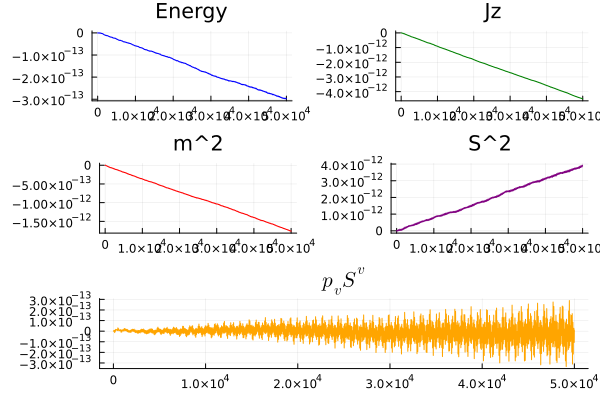

In [180]:
# Create subplots
# Create a 3x2 layout with the specified figsize
plot_layout = @layout [a b; c d; e]
# .plot(layout=plot_layout, size=(1200, 1500), dpi=100)
# Plot data on subplots
plot_array = []

p1 = Plots.plot(sol.t, getindex.(diffmotconst, 1), label="", title="Energy", color="blue")
p2 = Plots.plot(sol.t, getindex.(diffmotconst, 2), label="", title="Jz", color="green")
p3 = Plots.plot(sol.t, getindex.(diffmotconst, 3), label="", title="m^2", color="red")
p4 = Plots.plot(sol.t, getindex.(diffmotconst, 4), label="", title="S^2", color="purple")
p5 = Plots.plot(sol.t, getindex.(diffmotconst, 5), label="", title=L"p_v S^v", color="orange")

# Set legends
# for i in 1:3, j in 1:2
#     Plots.plot(legend=:topright)
# end

Plots.plot(p1, p2, p3, p4, p5, layout=plot_layout)
# Remove unused subplot
#  Plots.plot()  # or  nothing

In [181]:
poi_points = filter(x -> abs(x[3] - pi / 2) < 1e-13, sol.u)

715-element Vector{Vector{Float64}}:
 [0.0, 6.0, 1.5707963267948966, 0.0, -0.9295256859722207, 0.01, -1.2074196867581504, 2.6303626505089537, 0.5663854905750187, 0.0001, 0.0001, -9.284700397951957]
 [60.345829212166976, 5.405697471114687, 1.5707963267948963, 4.25264619012618, -0.9323378335361349, -0.03176421627751668, 1.3538544477161176, 2.5742975926328926, -0.5909164350987893, 0.4997956793886538, 0.5386921521287962, 8.140790325696946]
 [111.38535048009922, 5.375401799172785, 1.5707963267948968, 8.523106553468157, -0.9319568391612836, 0.027238429576874744, -1.780560874786701, 2.3325671338238427, 0.5860528305237227, -0.8167353577704224, 2.194039531928841, -7.260498436522077]
 [166.90942539721723, 5.955584748438505, 1.5707963267948963, 12.597290697590893, -0.9286286434038016, -0.007060947658968326, 2.19540160608329, 1.9812652693573372, -0.5495639825558487, 0.7310514001274936, 4.725479171528077, 6.95565219090408]
 [220.39492242223278, 5.263663847365554, 1.5707963267948977, 16.696656007061

In [182]:
length(poi_points)

715

In [183]:
vr = zeros(length(poi_points));
for i in range(1, length(vr))
    gkp = cov_metric_tensor(poi_points[i][2], poi_points[i][3], a0, M)
    gkinvp = cot_metric_tensor(poi_points[i][2], poi_points[i][3], a0, M)
    levip = levi_civita_tensor(gkp)
    @tullio levi_mixedp[ρ, σ, μ, ν] := gkp[ρ, x] * gkp[σ, y] * levip[x, y, μ, ν]
    # Stensorp = spintensor(levip, poi_points[i][5:8], poi_points[i][9:end], gkp, m)
    rulllp = kerr_riemann_tensor(poi_points[i][2], poi_points[i][3], a0, M)

    @tullio dRuluup[a, b, u, v] := 0.5 * rulllp[a, b, p, s] * levip[p, s, u, v] #This is the fully covariant form R_{abcd}
    @tullio ddRuuuup[a, b, u, v] := 0.5 * gkinvp[b, i] * dRuluup[a, i, p, s] * levi_mixedp[p, s, u, v]
    
    vr[i] = calculate_four_velocity(
        gkp,
        gkinvp,
        poi_points[i][5:8],
        poi_points[i][9:end],
        ddRuuuup,
    )[2]

end

In [184]:
r = [v[2] for v in poi_points];

In [185]:
corbit = map(x -> to_cartesian(x), sol.u);
xcorbit = [corbit[i][1] for i in 1:length(corbit)];

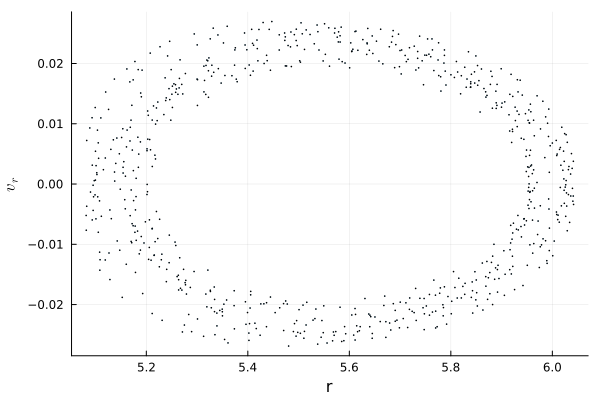

In [186]:
Plots.plot(getindex.(poi_points, 2), vr, seriestype=:scatter, ms=0.5, legend=false)
xlabel!("r")
ylabel!(L"v_r")

In [189]:
function Dcov_metric_tensor(r, theta, a, M=1.0)
    """
    Define the metric tensor function.

    Parameters:
        a (float): Parameter 'a' in the metric.
        r (float): Parameter 'r' in the metric.
        theta (float): Parameter 'theta' in the metric.

    Returns:
        ndarray: The metric tensor at the given values of a, r, and theta/pi.
        Configuration: ll
    """
    #! Correction Added Mass term in the symbols 
    dg = zeros(typeof(r), (4, 4, 4))

    Delta = a^2 - 2 * M * r + r^2
    Sigma = r^2 + a^2 * cos(theta)^2
    dSt = -(a^2) * sin(2 * theta)
    dSr = 2 * r
    dD = 2 * (r - M)

    dg[1, 1, [2,3]] = [
        2.0 * M * (-r * dSr + Sigma) / Sigma^2,
        -2.0 * M * r * dSt / Sigma^2,
    ]

    dg[2, 2, [2,3]] = [(Delta * dSr - Sigma * dD) / Delta^2, dSt / Delta]

    dg[3, 3, [2,3]] = [dSr, dSt]
    dg[4, 4, [2,3]] = [
        (
            (a^2 * Delta * sin(theta) ^ 2 - (a^2 + r^2) ^ 2) * dSr
            + (-(a^2) * dD * sin(theta) ^ 2 + 4 * r * (a^2 + r^2)) * Sigma
        )* sin(theta) ^ 2 / Sigma^2,
        (
            2
            * (-2 * a^2 * Delta * sin(theta) ^ 2 + (a^2 + r^2) ^ 2)
            * Sigma
            * cos(theta)
            + (a^2 * Delta * sin(theta) ^ 2 - (a^2 + r^2) ^ 2)
            * dSt
            * sin(theta)
        )* sin(theta) / Sigma^2]

    dg[1, 4, [2,3]] = [
        2.0 * M * a * (r * dSr - Sigma) * sin(theta) ^ 2 / Sigma^2,
        M * a * r * (-2.0 * Sigma * sin(2 * theta) - 1.0 * dSt * cos(2 * theta) + 1.0 * dSt) / Sigma^2]
    dg[4, 1, [2,3]] = dg[1, 4, [2,3]]

    return dg
end


Dcov_metric_tensor (generic function with 2 methods)

In [190]:
function Dcot_metric_tensor(r, theta, a, M=1.0)
    """
    Define the metric tensor function.

    Parameters:
        a (float): Parameter 'a' in the metric.
        r (float): Parameter 'r' in the metric.
        theta (float): Parameter 'theta' in the metric.

    Returns:
        ndarray: The metric tensor at the given values of a, r, and theta.
        Configuration: uu
    """
    Delta = a^2 - 2 * M * r + r^2
    Sigma = r^2 + a^2 * cos(theta) ^ 2
    dSt = -(a^2) * sin(2 * theta)
    dSr = 2 * r
    dD = 2 * (r - M)

    denom = Delta * sin(theta) ^ 2
    ddmr = dD * sin(theta) ^ 2
    ddmt = Delta * sin(2 * theta)

    denom = Delta * sin(theta)^2

    dg = zeros(typeof(r), (4, 4, 4))

    dg[1, 1, [2, 3]] = [(-(a^2 * Delta * sin(theta)^2 - (a^2 + r^2)^2) * Sigma * ddmr - (a^2 * Delta * sin(theta)^2 - (a^2 + r^2)^2) * dSr * denom + (a^2 * dD * sin(theta)^2 - 4 * r * (a^2 + r^2)) * Sigma * denom) * sin(theta)^2 / (Sigma^2 * denom^2), (-(a^2 * Delta * sin(theta)^2 - (a^2 + r^2)^2) * Sigma * ddmt * sin(theta) - (a^2 * Delta * sin(theta)^2 - (a^2 + r^2)^2) * dSt * denom * sin(theta) + 2 * (2 * a^2 * Delta * sin(theta)^2 - (a^2 + r^2)^2) * Sigma * denom * cos(theta)) * sin(theta) / (Sigma^2 * denom^2)]

    dg[2, 2, [2,3]] = [
        (-Delta * dSr + Sigma * dD) / Sigma^2,
        -Delta * dSt / Sigma^2,
    ]

    dg[3, 3, [2,3]] = [-1.0 * dSr / Sigma^2, -1.0 * dSt / Sigma^2]

    # dg[3, 3, [2,3]] = -(-(1.0 - 2.0 * r / Sigma)) / denom
    #! Corrected the dg[3,3], [2,3] term below
    dg[4, 4, [2, 3]] = [((a^2 * sin(theta)^2 - Delta) * Sigma * ddmr + (a^2 * sin(theta)^2 - Delta) * dSr * denom + Sigma * dD * denom) / (Sigma^2 * denom^2), (-(a^2) * Sigma * denom * sin(2 * theta) + (a^2 * sin(theta)^2 - Delta) * Sigma * ddmt + (a^2 * sin(theta)^2 - Delta) * dSt * denom) / (Sigma^2 * denom^2)]

    dg[1, 4, [2, 3]] = [2.0 * M * a * (r * Sigma * ddmr + r * dSr * denom - Sigma * denom) * sin(theta)^2 / (Sigma^2 * denom^2), M * a * r * (-1.0 * Sigma * ddmt * cos(2 * theta) + 1.0 * Sigma * ddmt - 2.0 * Sigma * denom * sin(2 * theta) - 1.0 * dSt * denom * cos(2 * theta) + 1.0 * dSt * denom) / (Sigma^2 * denom^2)]

    dg[4, 1, [2,3]] = dg[1, 4, [2,3]]

    return dg

end

Dcot_metric_tensor (generic function with 2 methods)

In [191]:
function Dkerr_christoffel(r, theta, a, M=1)
    """
    Function to give the Christoffel symbols for the Kerr metric.
    The Christoffel symbols are given as Gamma ^i _{jk}

    From Reference Paper, Appendix
    Config: ull
    """

    dcs = zeros(typeof(r), (4, 4, 4, 4))

    # Definitions
    Delta = a^2 - 2 * M * r + r^2
    Sigma = r^2 + a^2 * cos(theta) ^ 2
    dSt = -(a^2) * sin(2 * theta)
    dSr = 2 * r
    dD = 2 * (r - M)

    dcs[4, 1, 2, [2,3]] = [ M * a * ( (4 * r - dSr) * Delta * Sigma - 2 * (2 * r^2 - Sigma) * Delta * dSr - (2 * r^2 - Sigma) * Sigma * dD ) / (Delta^2 * Sigma^3), M * a * (-4 * r^2 + Sigma) * dSt / (Delta * Sigma^3)]

    dcs[1, 1, 2, [2,3]] = [ M * ( 2 * r * (a^2 * sin(theta) ^ 2 + 2 * r^2) * Delta * Sigma + 2 * (a^2 + r^2) * (a^2 * cos(theta) ^ 2 - r^2) * Delta * dSr + (a^2 + r^2) * (a^2 * cos(theta) ^ 2 - r^2) * Sigma * dD ) / (Delta^2 * Sigma^3), 2 * M * (a^2 + r^2) * ( (1 / 2) * a^2 * Sigma * sin(2 * theta) + (a^2 * cos(theta) ^ 2 - r^2) * dSt ) / (Delta * Sigma^3) ]

    dcs[4, 1, 3, [2,3]] = [ 2 * M * a * (2 * r * dSr - Sigma) / (Sigma^3 * tan(theta)), 2 * M * a * r * (Sigma + dSt * sin(2 * theta)) / (Sigma^3 * sin(theta) ^ 2) ]

    dcs[1, 1, 3, [2,3]] = [ M * a^2 * (2 * r * dSr - Sigma) * sin(2 * theta) / Sigma^3, 2 * M * a^2 * r * (-Sigma * cos(2 * theta) + dSt * sin(2 * theta)) / Sigma^3, ]

    dcs[1, 2, 4, [2,3]] = [ M * a * ( 2 * (2 * r^2 * (a^2 + r^2) - (a^2 - r^2) * Sigma) * Delta * dSr + (2 * r^2 * (a^2 + r^2) - (a^2 - r^2) * Sigma) * Sigma * dD - (4 * r^3 + 4 * r * (a^2 + r^2) + 2 * r * Sigma - (a^2 - r^2) * dSr) * Delta * Sigma ) * sin(theta) ^ 2 / (Delta^2 * Sigma^3), M * a * ( 2 * (2 * r^2 * (a^2 + r^2) - (a^2 - r^2) * Sigma) * dSt * sin(theta) + ( (a^2 - r^2) * dSt * sin(theta) + (-4 * r^2 * (a^2 + r^2) + 2 * (a^2 - r^2) * Sigma) * cos(theta) ) * Sigma ) * sin(theta) / (Delta * Sigma^3)]

    dcs[4, 2, 4, [2,3]] = [ ( 2 * ( M * a^2 * (2 * r^2 - Sigma) * sin(theta) ^ 2 + r * (2 * M * r - Sigma) * Sigma ) * Delta * dSr + ( M * a^2 * (2 * r^2 - Sigma) * sin(theta) ^ 2 + r * (2 * M * r - Sigma) * Sigma ) * Sigma * dD - ( M * a^2 * (4 * r - dSr) * sin(theta) ^ 2 + r * (2 * M - dSr) * Sigma + r * (2 * M * r - Sigma) * dSr + (2 * M * r - Sigma) * Sigma ) * Delta * Sigma ) / (Delta^2 * Sigma^3), M * ( -2 * a^2 * r^2 * Sigma * sin(2 * theta) + 4 * a^2 * r^2 * dSt * sin(theta) ^ 2 + a^2 * Sigma^2 * sin(2 * theta) - a^2 * Sigma * dSt * sin(theta) ^ 2 + 2 * r^2 * Sigma * dSt ) / (Delta * Sigma^3)]

    dcs[1, 3, 4, [2,3]] = [ 2 * M * a^3 * (-2 * r * dSr + Sigma) * sin(theta) ^ 3 * cos(theta) / Sigma^3, 2 * M * a^3 * r * (Sigma * sin(3 * theta) - dSt * sin(theta) * sin(2 * theta)) * sin(theta) / Sigma^3]

    dcs[4, 3, 4, [2,3]] = [ M * a^2 * (-2 * r * dSr + Sigma) * sin(2 * theta) / Sigma^3, 2 * M * a^2 * r * cos(2 * theta) / Sigma^2 - 2 * M * a^2 * r * dSt * sin(2 * theta) / Sigma^3 + 2 / (cos(2 * theta) - 1)]

    dcs[2, 1, 1, [2,3]] = [ M * ( -3 * (2 * r^2 - Sigma) * Delta * dSr + ((4 * r - dSr) * Delta + (2 * r^2 - Sigma) * dD) * Sigma ) / Sigma^4, 2 * M * (-3 * r^2 + Sigma) * Delta * dSt / Sigma^4]

    dcs[2, 1, 4, [2,3]] = [ M * a * ( 3 * (2 * r^2 - Sigma) * Delta * dSr - ((4 * r - dSr) * Delta + (2 * r^2 - Sigma) * dD) * Sigma ) * sin(theta) ^ 2 / Sigma^4, M * a * ( 3 * (2 * r^2 - Sigma) * dSt * sin(theta) + ((-4 * r^2 + 2 * Sigma) * cos(theta) + dSt * sin(theta)) * Sigma ) * Delta * sin(theta) / Sigma^4]

    dcs[3, 1, 1, [2,3]] = [ M * a^2 * (3 * r * dSr - Sigma) * sin(2 * theta) / Sigma^4, M * a^2 * r * (-2 * Sigma * cos(2 * theta) + 3 * dSt * sin(2 * theta)) / Sigma^4]

    dcs[3, 1, 4, [2,3]] = [ (1 / 2) * M * a * (-6.0 * r * (a^2 + r^2) * dSr + (2.0 * a^2 + 6.0 * r^2) * Sigma) * sin(2 * theta) / Sigma^4, M * a * r * (a^2 + r^2) * (2.0 * Sigma * cos(2 * theta) - 3.0 * dSt * sin(2 * theta)) / Sigma^4]

    dcs[2, 2, 2, [2,3]] = [ -M * dD / Delta^2 - r * dSr / Sigma^2 + r * dD / Delta^2 + 1 / Sigma - 1 / Delta, -r * dSt / Sigma^2]

    dcs[2, 3, 3, [2,3]] = [ (r * Delta * dSr - (r * dD + Delta) * Sigma) / Sigma^2, r * Delta * dSt / Sigma^2]

    dcs[3, 2, 3, [2,3]] = [(-r * dSr + Sigma) / Sigma^2, -r * dSt / Sigma^2]

    dcs[2, 2, 3, [2,3]] = dcs[3, 3, 3, [2,3]] = [ (1 / 2) * a^2 * dSr * sin(2 * theta) / Sigma^2, a^2 * (-Sigma * cos(2 * theta) + (1 / 2) * dSt * sin(2 * theta)) / Sigma^2]

    dcs[3, 2, 2, [2,3]] = [ (1 / 2) * a^2 * (-Delta * dSr - Sigma * dD) * sin(2 * theta) / (Delta^2 * Sigma^2), a^2 * (Sigma * cos(2 * theta) - 1 / 2 * dSt * sin(2 * theta)) / (Delta * Sigma^2)]

    dcs[2, 4, 4, [2,3]] = [ ( ( (M * a^2 * (2 * r^2 - Sigma) * sin(theta) ^ 2 - r * Sigma^2) * dD - ( -M * a^2 * (4 * r - dSr) * sin(theta) ^ 2 + 2 * r * Sigma * dSr + Sigma^2 ) * Delta ) * Sigma - 3 * (M * a^2 * (2 * r^2 - Sigma) * sin(theta) ^ 2 - r * Sigma^2) * Delta * dSr ) * sin(theta) ^ 2 / Sigma^4, ( -3 / 2 * M * a^2 * r^2 * (1 - cos(2 * theta)) ^ 2 * dSt + 2 * M * a^2 * r^2 * Sigma * sin(2 * theta) - M * a^2 * r^2 * Sigma * sin(4 * theta) + (1 / 2) * M * a^2 * (1 - cos(2 * theta)) ^ 2 * Sigma * dSt - M * a^2 * Sigma^2 * sin(2 * theta) + (1 / 2) * M * a^2 * Sigma^2 * sin(4 * theta) - r * Sigma^3 * sin(2 * theta) - 1 / 2 * r * Sigma^2 * dSt * cos(2 * theta) + (1 / 2) * r * Sigma^2 * dSt ) * Delta / Sigma^4]

    dcs[3, 4, 4, [2,3]] = [ (1 / 2) * ( 3 * (2 * M * r * (a^2 + r^2) ^ 2 + Delta * Sigma^2) * dSr - ( 8 * M * r^2 * (a^2 + r^2) + 2 * M * (a^2 + r^2) ^ 2 + 2 * Delta * Sigma * dSr + Sigma^2 * dD ) * Sigma ) * sin(2 * theta) / Sigma^4, -2 * M * r * (a^2 + r^2) ^ 2 * cos(2 * theta) / Sigma^3 + 3 * M * r * (a^2 + r^2) ^ 2 * dSt * sin(2 * theta) / Sigma^4 - Delta * cos(2 * theta) / Sigma + (1 / 2) * Delta * dSt * sin(2 * theta) / Sigma^2]

    #By symmetry. https://mathworld.wolfram.com/ChristoffelSymboloftheSecondKind.html
    dcs[1, 2, 1, [2,3]] = dcs[1, 1, 2, [2,3]]
    dcs[1, 3, 1, [2,3]] = dcs[1, 1, 3, [2,3]]
    dcs[1, 4, 2, [2,3]] = dcs[1, 2, 4, [2,3]]
    dcs[1, 4, 3, [2,3]] = dcs[1, 3, 4, [2,3]]


    dcs[2, 4, 1, [2,3]] = dcs[2, 1, 4, [2,3]]
    dcs[2, 3, 2, [2,3]] = dcs[2, 2, 3, [2,3]]

    dcs[3, 4, 1, [2,3]] = dcs[3, 1, 4, [2,3]]
    dcs[3, 3, 2, [2,3]] = dcs[3, 2, 3, [2,3]]

    dcs[4, 2, 1, [2,3]] = dcs[4, 1, 2, [2,3]]
    dcs[4, 3, 1, [2,3]] = dcs[4, 1, 3, [2,3]]
    dcs[4, 4, 2, [2,3]] = dcs[4, 2, 4, [2,3]]
    dcs[4, 4, 3, [2,3]] = dcs[4, 3, 4, [2,3]]

    return dcs + zeros((4, 4, 4, 4))
end


Dkerr_christoffel (generic function with 2 methods)

In [192]:
function DRijkl(r, theta, a, M=1.0)
    # Define variables
    drijkl = zeros( (4, 4, 4, 4,4))

    # Definitions
    Delta=  a^2 - 2 * M * r + r^2
    Sigma =  r^2 + a^2 * cos(theta) ^ 2
    dSt= -a^2*sin(2*theta)
    dSr=  2*r
    dD=  2*(r-M)

    drijkl[1, 1, 1, 4, [1,2,3,4]] = [0, M^2*a*r*(8.0*r*(3.0*a^2*cos(theta)^2 - r^2)*dSr + 4.0*(-3.0*a^2*cos(theta)^2 + 2.0*r^2)*Sigma)*sin(theta)^2/Sigma^5, M^2*a*r^2*(-3.0*a^2*Sigma*sin(4*theta) - 3.0*a^2*dSt*cos(4*theta) + 3.0*a^2*dSt + 2.0*r^2*Sigma*sin(2*theta) + 4.0*r^2*dSt*cos(2*theta) - 4.0*r^2*dSt)/Sigma^5, 0.]

    drijkl[1, 1, 2, 3, [1,2,3,4]] = [0, M^2*a^2*(-6.0*r*(a^2*cos(theta)^2 - 3.0*r^2)*Delta*dSr - 2.0*r*(a^2*cos(theta)^2 - 3.0*r^2)*Sigma*dD + (2.0*a^2*cos(theta)^2 - 18.0*r^2)*Delta*Sigma)*sin(theta)*cos(theta)/(Delta^2*Sigma^4), M^2*a^2*r*(-6.0*(a^2*cos(theta)^2 - 3.0*r^2)*dSt*sin(theta)*cos(theta) + (8.0*a^2*sin(theta)^4 - 10.0*a^2*sin(theta)^2 + 2.0*a^2 + 12.0*r^2*sin(theta)^2 - 6.0*r^2)*Sigma)/(Delta*Sigma^4), 0.]

    drijkl[1, 2, 1, 2, [1,2,3,4]] = [0, M*(3*r*(3.0*a^2*cos(theta)^2 - r^2)*(a^2*sin(theta)^2 + 2.0*a^2 + 2.0*r^2)*Delta*dSr + r*(3.0*a^2*cos(theta)^2 - r^2)*(a^2*sin(theta)^2 + 2.0*a^2 + 2.0*r^2)*Sigma*dD + (3.0*a^4*sin(theta)^4 + 3.0*a^4*sin(theta)^2 - 6.0*a^4 + 21.0*a^2*r^2*sin(theta)^2 - 12.0*a^2*r^2 + 10.0*r^4)*Delta*Sigma)/(Delta^2*Sigma^4), M*r*(a^2*(12.0*a^2*sin(theta)^2 + 6.0*a^2 + 14.0*r^2)*Sigma*sin(theta)*cos(theta) + 3*(3.0*a^2*cos(theta)^2 - r^2)*(a^2*sin(theta)^2 + 2.0*a^2 + 2.0*r^2)*dSt)/(Delta*Sigma^4), 0.]

    drijkl[1, 2, 1, 3, [1,2,3,4]] = [0, M*a^2*(-3*(a^2*cos(theta)^2 - 3.0*r^2)*(-2*M*r + 3.0*a^2 + 3.0*r^2)*Delta*dSr - (a^2*cos(theta)^2 - 3.0*r^2)*(-2*M*r + 3.0*a^2 + 3.0*r^2)*Sigma*dD + (-6.0*r*(-2*M*r + 3.0*a^2 + 3.0*r^2) + (-2*M + 6.0*r)*(a^2*cos(theta)^2 - 3.0*r^2))*Delta*Sigma)*sin(theta)*cos(theta)/(Delta^2*Sigma^4), M*a^2*(-3*(a^2*cos(theta)^2 - 3.0*r^2)*dSt*sin(theta)*cos(theta) + (4.0*a^2*sin(theta)^4 - 5.0*a^2*sin(theta)^2 + 1.0*a^2 + 6.0*r^2*sin(theta)^2 - 3.0*r^2)*Sigma)*(-2*M*r + 3.0*a^2 + 3.0*r^2)/(Delta*Sigma^4), 0.]

    drijkl[1, 2, 2, 4, [1,2,3,4]] = [0, M*a*(9.0*r*(a^2 + r^2)*(3.0*a^2*cos(theta)^2 - r^2)*Delta*dSr + 3.0*r*(a^2 + r^2)*(3.0*a^2*cos(theta)^2 - r^2)*Sigma*dD + (-9.0*a^4*cos(theta)^2 - 27.0*a^2*r^2*cos(theta)^2 + 9.0*a^2*r^2 + 15.0*r^4)*Delta*Sigma)*sin(theta)^2/(Delta^2*Sigma^4), M*a*r*(a^2 + r^2)*(-4.5*a^2*Sigma*sin(4*theta) - 3.375*a^2*dSt*cos(4*theta) + 3.375*a^2*dSt + 3.0*r^2*Sigma*sin(2*theta) + 4.5*r^2*dSt*cos(2*theta) - 4.5*r^2*dSt)/(Delta*Sigma^4), 0.]

    drijkl[1, 2, 3, 4, [1,2,3,4]] = [0., M*a*(-3*(a^2*cos(theta)^2 - 3.0*r^2)*(a^2*Delta*sin(theta)^2 + 2.0*(a^2 + r^2)^2)*Delta*dSr - (a^2*cos(theta)^2 - 3.0*r^2)*(a^2*Delta*sin(theta)^2 + 2.0*(a^2 + r^2)^2)*Sigma*dD + (-6.0*r*(a^2*Delta*sin(theta)^2 + 2.0*(a^2 + r^2)^2) + (a^2*cos(theta)^2 - 3.0*r^2)*(a^2*dD*sin(theta)^2 + 8.0*r*(a^2 + r^2)))*Delta*Sigma)*sin(theta)*cos(theta)/(Delta^2*Sigma^4), M*a*(2*a^2*(a^2*cos(theta)^2 - 3.0*r^2)*Delta*Sigma*sin(theta)^2*cos(theta)^2 - 3*(a^2*cos(theta)^2 - 3.0*r^2)*(a^2*Delta*sin(theta)^2 + 2.0*(a^2 + r^2)^2)*dSt*sin(theta)*cos(theta) + (a^2*Delta*sin(theta)^2 + 2.0*(a^2 + r^2)^2)*(4.0*a^2*sin(theta)^4 - 5.0*a^2*sin(theta)^2 + 1.0*a^2 + 6.0*r^2*sin(theta)^2 - 3.0*r^2)*Sigma)/(Delta*Sigma^4), 0.]

    #Antisymmetric under exchange of last two indices. 
    drijkl[1, 1, 4, 1, [1,2,3,4]] = -drijkl[1, 1, 1, 4, [1,2,3,4]]
    drijkl[1, 1, 3, 2, [1,2,3,4]] = -drijkl[1, 1, 2, 3, [1,2,3,4]]
    drijkl[1, 2, 2, 1, [1,2,3,4]] = -drijkl[1, 2, 1, 2, [1,2,3,4]]
    drijkl[1, 2, 3, 1, [1,2,3,4]] = -drijkl[1, 2, 1, 3, [1,2,3,4]]
    drijkl[1, 2, 4, 2, [1,2,3,4]] = -drijkl[1, 2, 2, 4, [1,2,3,4]]
    drijkl[1, 2, 4, 3, [1,2,3,4]] = -drijkl[1, 2, 3, 4, [1,2,3,4]]

    #!-------------------------------------------------------------------------------

    drijkl[1, 3, 1, 2, [1,2,3,4]] = [0., M*a^2*(-3*(a^2*cos(theta)^2 - 3.0*r^2)*(-4*M*r + 3.0*a^2 + 3.0*r^2)*Delta*dSr - (a^2*cos(theta)^2 - 3.0*r^2)*(-4*M*r + 3.0*a^2 + 3.0*r^2)*Sigma*dD + (-6.0*r*(-4*M*r + 3.0*a^2 + 3.0*r^2) + (-4*M + 6.0*r)*(a^2*cos(theta)^2 - 3.0*r^2))*Delta*Sigma)*sin(theta)*cos(theta)/(Delta^2*Sigma^4), M*a^2*(-3*(a^2*cos(theta)^2 - 3.0*r^2)*dSt*sin(theta)*cos(theta) + (4.0*a^2*sin(theta)^4 - 5.0*a^2*sin(theta)^2 + 1.0*a^2 + 6.0*r^2*sin(theta)^2 - 3.0*r^2)*Sigma)*(-4*M*r + 3.0*a^2 + 3.0*r^2)/(Delta*Sigma^4), 0.]

    drijkl[1, 3, 1, 3, [1,2,3,4]] = [0., M*(-3*r*(3.0*a^2*cos(theta)^2 - r^2)*(2*a^2*sin(theta)^2 + a^2 + r^2)*dSr + (-6.0*a^4*sin(theta)^4 + 3.0*a^4*sin(theta)^2 + 3.0*a^4 - 15.0*a^2*r^2*sin(theta)^2 + 6.0*a^2*r^2 - 5.0*r^4)*Sigma)/Sigma^4, M*r*(a^2*(-24.0*a^2*sin(theta)^2 + 6.0*a^2 - 10.0*r^2)*Sigma*sin(theta)*cos(theta) - 3*(3.0*a^2*cos(theta)^2 - r^2)*(2*a^2*sin(theta)^2 + a^2 + r^2)*dSt)/Sigma^4, 0.]

    drijkl[1, 3, 2, 4, [1,2,3,4]] = [0., M*a*(-3*(a^2*cos(theta)^2 - 3.0*r^2)*(2.0*a^2*Delta*sin(theta)^2 + (a^2 + r^2)^2)*Delta*dSr - (a^2*cos(theta)^2 - 3.0*r^2)*(2.0*a^2*Delta*sin(theta)^2 + (a^2 + r^2)^2)*Sigma*dD + (-6.0*r*(2.0*a^2*Delta*sin(theta)^2 + (a^2 + r^2)^2) + (a^2*cos(theta)^2 - 3.0*r^2)*(2.0*a^2*dD*sin(theta)^2 + 4*r*(a^2 + r^2)))*Delta*Sigma)*sin(theta)*cos(theta)/(Delta^2*Sigma^4), M*a*(4.0*a^2*(a^2*cos(theta)^2 - 3.0*r^2)*Delta*Sigma*sin(theta)^2*cos(theta)^2 - 3*(a^2*cos(theta)^2 - 3.0*r^2)*(2.0*a^2*Delta*sin(theta)^2 + (a^2 + r^2)^2)*dSt*sin(theta)*cos(theta) + (2.0*a^2*Delta*sin(theta)^2 + (a^2 + r^2)^2)*(4.0*a^2*sin(theta)^4 - 5.0*a^2*sin(theta)^2 + 1.0*a^2 + 6.0*r^2*sin(theta)^2 - 3.0*r^2)*Sigma)/(Delta*Sigma^4), 0.]

    drijkl[1, 3, 3, 4, [1,2,3,4]] = [0., M*a*(-9.0*r*(a^2 + r^2)*(3.0*a^2*cos(theta)^2 - r^2)*dSr + (9.0*a^4*cos(theta)^2 + 27.0*a^2*r^2*cos(theta)^2 - 9.0*a^2*r^2 - 15.0*r^4)*Sigma)*sin(theta)^2/Sigma^4, M*a*r*(a^2 + r^2)*(4.5*a^2*Sigma*sin(4*theta) + 3.375*a^2*dSt*cos(4*theta) - 3.375*a^2*dSt - 3.0*r^2*Sigma*sin(2*theta) - 4.5*r^2*dSt*cos(2*theta) + 4.5*r^2*dSt)/Sigma^4, 0.]

    drijkl[1, 4, 1, 4, [1,2,3,4]] = [0., M*(-4*r*(-3*a^2*cos(theta)^2 + r^2)*(a^2*Delta*sin(theta)^2 - (a^2 + r^2)^2)*dSr + (2*r^2*(a^2*Delta*sin(theta)^2 - (a^2 + r^2)^2) + r*(-3*a^2*cos(theta)^2 + r^2)*(a^2*dD*sin(theta)^2 - 4*r*(a^2 + r^2)) + (-3*a^2*cos(theta)^2 + r^2)*(a^2*Delta*sin(theta)^2 - (a^2 + r^2)^2))*Sigma)*sin(theta)^2/Sigma^5, 2*M*r*(-2*(-3*a^2*cos(theta)^2 + r^2)*(a^2*Delta*sin(theta)^2 - (a^2 + r^2)^2)*dSt*sin(theta) + (a^2*(-3*a^2*cos(theta)^2 + r^2)*Delta*sin(theta)^2 + 3*a^2*(a^2*Delta*sin(theta)^2 - (a^2 + r^2)^2)*sin(theta)^2 + (-3*a^2*cos(theta)^2 + r^2)*(a^2*Delta*sin(theta)^2 - (a^2 + r^2)^2))*Sigma*cos(theta))*sin(theta)/Sigma^5, 0.]

    drijkl[1, 4, 2, 3, [1,2,3,4]] = [0., M*a*(-3*(a^2*cos(theta)^2 - 3.0*r^2)*(a^2*Delta*sin(theta)^2 - (a^2 + r^2)^2)*Delta*dSr - (a^2*cos(theta)^2 - 3.0*r^2)*(a^2*Delta*sin(theta)^2 - (a^2 + r^2)^2)*Sigma*dD + (-6.0*r*(a^2*Delta*sin(theta)^2 - (a^2 + r^2)^2) + (a^2*cos(theta)^2 - 3.0*r^2)*(a^2*dD*sin(theta)^2 - 4*r*(a^2 + r^2)))*Delta*Sigma)*sin(theta)*cos(theta)/(Delta^2*Sigma^4), M*a*(2*a^2*(a^2*cos(theta)^2 - 3.0*r^2)*Delta*Sigma*sin(theta)^2*cos(theta)^2 - 3*(a^2*cos(theta)^2 - 3.0*r^2)*(a^2*Delta*sin(theta)^2 - (a^2 + r^2)^2)*dSt*sin(theta)*cos(theta) + (a^2*Delta*sin(theta)^2 - (a^2 + r^2)^2)*(4.0*a^2*sin(theta)^4 - 5.0*a^2*sin(theta)^2 + 1.0*a^2 + 6.0*r^2*sin(theta)^2 - 3.0*r^2)*Sigma)/(Delta*Sigma^4), 0.]

    #Symmetries
    drijkl[1, 3, 2, 1, [1,2,3,4]] = -drijkl[1, 3, 1, 2, [1,2,3,4]]
    drijkl[1, 3, 3, 1, [1,2,3,4]] = -drijkl[1, 3, 1, 3, [1,2,3,4]]
    drijkl[1, 3, 4, 2, [1,2,3,4]] = -drijkl[1, 3, 2, 4, [1,2,3,4]]
    drijkl[1, 3, 4, 3, [1,2,3,4]] = -drijkl[1, 3, 3, 4, [1,2,3,4]]
    drijkl[1, 4, 4, 1, [1,2,3,4]] = -drijkl[1, 4, 1, 4, [1,2,3,4]]
    drijkl[1, 4, 3, 2, [1,2,3,4]] = -drijkl[1, 4, 2, 3, [1,2,3,4]]

    #!------------------------------------------------------------------------------------
    drijkl[2, 1, 1, 2, [1,2,3,4]] = [0., M*(4*r*(a^2*sin(theta)^2 + 2.0*Delta)*(3.0*a^2*cos(theta)^2 - r^2)*dSr + (2*r^2*(a^2*sin(theta)^2 + 2.0*Delta) - 2.0*r*(3.0*a^2*cos(theta)^2 - r^2)*dD - (a^2*sin(theta)^2 + 2.0*Delta)*(3.0*a^2*cos(theta)^2 - r^2))*Sigma)/Sigma^5, M*r*(a^2*(12.0*a^2*sin(theta)^2 - 6.0*a^2 + 2.0*r^2 + 12.0*Delta)*Sigma*sin(theta)*cos(theta) + 4*(a^2*sin(theta)^2 + 2.0*Delta)*(3.0*a^2*cos(theta)^2 - r^2)*dSt)/Sigma^5, 0.]

    drijkl[2, 1, 1, 3, [1,2,3,4]] = [0., M*a^2*(-12.0*(a^2*cos(theta)^2 - 3.0*r^2)*Delta*dSr + (-18.0*r*Delta + 3.0*(a^2*cos(theta)^2 - 3.0*r^2)*dD)*Sigma)*sin(theta)*cos(theta)/Sigma^5, M*a^2*(-12.0*(a^2*cos(theta)^2 - 3.0*r^2)*dSt*sin(theta)*cos(theta) + (12.0*a^2*sin(theta)^4 - 15.0*a^2*sin(theta)^2 + 3.0*a^2 + 18.0*r^2*sin(theta)^2 - 9.0*r^2)*Sigma)*Delta/Sigma^5, 0.]

    drijkl[2, 1, 2, 4, [1,2,3,4]] = [0., M*a*(4*r*(3.0*a^2*cos(theta)^2 - r^2)*(-4.0*M*r + 3.0*a^2 + 3.0*r^2)*dSr + (r^2*(-8.0*M*r + 6.0*a^2 + 6.0*r^2) + r*(4.0*M - 6.0*r)*(3.0*a^2*cos(theta)^2 - r^2) + (3.0*a^2*cos(theta)^2 - r^2)*(4.0*M*r - 3.0*a^2 - 3.0*r^2))*Sigma)*sin(theta)^2/Sigma^5, M*a*r*(-4.0*M*r + 3.0*a^2 + 3.0*r^2)*(-1.5*a^2*Sigma*sin(4*theta) - 1.5*a^2*dSt*cos(4*theta) + 1.5*a^2*dSt + r^2*Sigma*sin(2*theta) + 2.0*r^2*dSt*cos(2*theta) - 2.0*r^2*dSt)/Sigma^5, 0.]

    drijkl[2, 1, 3, 4, [1,2,3,4]] = [0., M*a*(-4*(a^2*cos(theta)^2 - 3.0*r^2)*(a^2*sin(theta)^2 + 2.0*a^2 + 2.0*r^2)*Delta*dSr + (4.0*r*(a^2*cos(theta)^2 - 3.0*r^2)*Delta - 6.0*r*(a^2*sin(theta)^2 + 2.0*a^2 + 2.0*r^2)*Delta + (a^2*cos(theta)^2 - 3.0*r^2)*(a^2*sin(theta)^2 + 2.0*a^2 + 2.0*r^2)*dD)*Sigma)*sin(theta)*cos(theta)/Sigma^5, M*a*(-4*(a^2*cos(theta)^2 - 3.0*r^2)*(a^2*sin(theta)^2 + 2.0*a^2 + 2.0*r^2)*dSt*sin(theta)*cos(theta) + (6.0*a^4*sin(theta)^6 - 1.0*a^4*sin(theta)^4 - 7.0*a^4*sin(theta)^2 + 2.0*a^4 + 20.0*a^2*r^2*sin(theta)^4 - 7.0*a^2*r^2*sin(theta)^2 - 4.0*a^2*r^2 + 12.0*r^4*sin(theta)^2 - 6.0*r^4)*Sigma)*Delta/Sigma^5, 0.]

    drijkl[2, 3, 1, 4, [1,2,3,4]] = [0., M*a*(-3*(a^2*cos(theta)^2 - 3.0*r^2)*Delta*dSr + (-6.0*r*Delta + (a^2*cos(theta)^2 - 3.0*r^2)*dD)*Sigma)*sin(theta)*cos(theta)/Sigma^4, M*a*(-3*(a^2*cos(theta)^2 - 3.0*r^2)*dSt*sin(theta)*cos(theta) + (4.0*a^2*sin(theta)^4 - 5.0*a^2*sin(theta)^2 + 1.0*a^2 + 6.0*r^2*sin(theta)^2 - 3.0*r^2)*Sigma)*Delta/Sigma^4, 0.]

    drijkl[2, 3, 2, 3, [1,2,3,4]] = [0., M*(-2*r*(3.0*a^2*cos(theta)^2 - r^2)*dSr + 3.0*(a^2*cos(theta)^2 - r^2)*Sigma)/Sigma^3, M*r*(-3.0*a^2*Sigma*sin(2*theta) - 2*(3.0*a^2*cos(theta)^2 - r^2)*dSt)/Sigma^3, 0.]

    drijkl[2, 4, 1, 2, [1,2,3,4]] = [0., M*a*(-4*r*(3.0*a^2*cos(theta)^2 - r^2)*(-4.0*M*r + 3.0*a^2 + 3.0*r^2)*dSr + (r^2*(8.0*M*r - 6.0*a^2 - 6.0*r^2) - r*(4.0*M - 6.0*r)*(3.0*a^2*cos(theta)^2 - r^2) + (3.0*a^2*cos(theta)^2 - r^2)*(-4.0*M*r + 3.0*a^2 + 3.0*r^2))*Sigma)*sin(theta)^2/Sigma^5, M*a*r*(-4.0*M*r + 3.0*a^2 + 3.0*r^2)*(1.5*a^2*Sigma*sin(4*theta) + 1.5*a^2*dSt*cos(4*theta) - 1.5*a^2*dSt - 1.0*r^2*Sigma*sin(2*theta) - 2.0*r^2*dSt*cos(2*theta) + 2.0*r^2*dSt)/Sigma^5, 0.]


    drijkl[2, 4, 1, 3, [1,2,3,4]] = [0., M*a*(4*(a^2*cos(theta)^2 - 3.0*r^2)*(2.0*a^2*sin(theta)^2 + a^2 + r^2)*Delta*dSr + (-2*r*(a^2*cos(theta)^2 - 3.0*r^2)*Delta + 6.0*r*(2.0*a^2*sin(theta)^2 + a^2 + r^2)*Delta - (a^2*cos(theta)^2 - 3.0*r^2)*(2.0*a^2*sin(theta)^2 + a^2 + r^2)*dD)*Sigma)*sin(theta)*cos(theta)/Sigma^5, M*a*(4*(a^2*cos(theta)^2 - 3.0*r^2)*(2.0*a^2*sin(theta)^2 + a^2 + r^2)*dSt*sin(theta)*cos(theta) + (-12.0*a^4*sin(theta)^6 + 14.0*a^4*sin(theta)^4 - 1.0*a^4*sin(theta)^2 - 1.0*a^4 - 28.0*a^2*r^2*sin(theta)^4 + 17.0*a^2*r^2*sin(theta)^2 + 2.0*a^2*r^2 - 6.0*r^4*sin(theta)^2 + 3.0*r^4)*Sigma)*Delta/Sigma^5, 0.]

    drijkl[2, 4, 2, 4, [1,2,3,4]] = [0., M*(-4*r*(3.0*a^2*cos(theta)^2 - r^2)*(2.0*a^2*Delta*sin(theta)^2 + (a^2 + r^2)^2)*dSr + (-2*r^2*(2.0*a^2*Delta*sin(theta)^2 + (a^2 + r^2)^2) + r*(3.0*a^2*cos(theta)^2 - r^2)*(2.0*a^2*dD*sin(theta)^2 + 4*r*(a^2 + r^2)) + (3.0*a^2*cos(theta)^2 - r^2)*(2.0*a^2*Delta*sin(theta)^2 + (a^2 + r^2)^2))*Sigma)*sin(theta)^2/Sigma^5, M*r*(-4*(3.0*a^2*cos(theta)^2 - r^2)*(2.0*a^2*Delta*sin(theta)^2 + (a^2 + r^2)^2)*dSt*sin(theta) + (4.0*a^2*(3.0*a^2*cos(theta)^2 - r^2)*Delta*sin(theta)^2 - 6.0*a^2*(2.0*a^2*Delta*sin(theta)^2 + (a^2 + r^2)^2)*sin(theta)^2 + 2*(3.0*a^2*cos(theta)^2 - r^2)*(2.0*a^2*Delta*sin(theta)^2 + (a^2 + r^2)^2))*Sigma*cos(theta))*sin(theta)/Sigma^5, 0.]


    drijkl[2, 4, 3, 4, [1,2,3,4]] = [0., M*a^2*(12.0*(a^2 + r^2)*(a^2*cos(theta)^2 - 3.0*r^2)*Delta*dSr + (18.0*r*(a^2 + r^2)*Delta - 6.0*r*(a^2*cos(theta)^2 - 3.0*r^2)*Delta - 3.0*(a^2 + r^2)*(a^2*cos(theta)^2 - 3.0*r^2)*dD)*Sigma)*sin(theta)^3*cos(theta)/Sigma^5, M*a^2*(a^2 + r^2)*(12.0*(a^2*cos(theta)^2 - 3.0*r^2)*dSt*sin(theta)*cos(theta) + (-18.0*a^2*sin(theta)^4 + 27.0*a^2*sin(theta)^2 - 9.0*a^2 - 36.0*r^2*sin(theta)^2 + 27.0*r^2)*Sigma)*Delta*sin(theta)^2/Sigma^5, 0.]

    #Symmetries
    drijkl[2, 1, 2, 1, [1,2,3,4]] = -drijkl[2, 1, 1, 2, [1,2,3,4]]
    drijkl[2, 1, 3, 1, [1,2,3,4]] = -drijkl[2, 1, 1, 3, [1,2,3,4]]
    drijkl[2, 1, 4, 2, [1,2,3,4]] = -drijkl[2, 1, 2, 4, [1,2,3,4]]
    drijkl[2, 1, 4, 3, [1,2,3,4]] = -drijkl[2, 1, 3, 4, [1,2,3,4]]
    drijkl[2, 3, 4, 1, [1,2,3,4]] = -drijkl[2, 3, 1, 4, [1,2,3,4]]
    drijkl[2, 3, 3, 2, [1,2,3,4]] = -drijkl[2, 3, 2, 3, [1,2,3,4]]
    drijkl[2, 4, 2, 1, [1,2,3,4]] = -drijkl[2, 4, 1, 2, [1,2,3,4]]
    drijkl[2, 4, 3, 1, [1,2,3,4]] = -drijkl[2, 4, 1, 3, [1,2,3,4]]
    drijkl[2, 4, 4, 2, [1,2,3,4]] = -drijkl[2, 4, 2, 4, [1,2,3,4]]
    drijkl[2, 4, 4, 3, [1,2,3,4]] = -drijkl[2, 4, 3, 4, [1,2,3,4]]

    #!----------------------------------------------------------------------------------------

    drijkl[3, 1, 1, 2, [1,2,3,4]] = [0., M*a^2*(-18.0*r*Sigma - 12.0*(a^2*cos(theta)^2 - 3.0*r^2)*dSr)*sin(theta)*cos(theta)/Sigma^5, M*a^2*(-12.0*(a^2*cos(theta)^2 - 3.0*r^2)*dSt*sin(theta)*cos(theta) + (12.0*a^2*sin(theta)^4 - 15.0*a^2*sin(theta)^2 + 3.0*a^2 + 18.0*r^2*sin(theta)^2 - 9.0*r^2)*Sigma)/Sigma^5, 0.] 

    drijkl[3, 1, 1, 3, [1,2,3,4]] = [0., M*(-4*r*(2.0*a^2*sin(theta)^2 + Delta)*(3.0*a^2*cos(theta)^2 - r^2)*dSr + (-2*r^2*(2.0*a^2*sin(theta)^2 + Delta) + r*(3.0*a^2*cos(theta)^2 - r^2)*dD + (2.0*a^2*sin(theta)^2 + Delta)*(3.0*a^2*cos(theta)^2 - r^2))*Sigma)/Sigma^5, M*r*(a^2*(-24.0*a^2*sin(theta)^2 + 12.0*a^2 - 4.0*r^2 - 6.0*Delta)*Sigma*sin(theta)*cos(theta) - 4*(2.0*a^2*sin(theta)^2 + Delta)*(3.0*a^2*cos(theta)^2 - r^2)*dSt)/Sigma^5, 0.]

    drijkl[3, 1, 2, 4, [1,2,3,4]] = [0., M*a*(r*(14.0*a^2*cos(theta)^2 - 18.0*a^2 - 12.0*r^2)*Sigma - 4*(a^2*cos(theta)^2 - 3.0*r^2)*(2.0*a^2*sin(theta)^2 + a^2 + r^2)*dSr)*sin(theta)*cos(theta)/Sigma^5, M*a*(-4*(a^2*cos(theta)^2 - 3.0*r^2)*(2.0*a^2*sin(theta)^2 + a^2 + r^2)*dSt*sin(theta)*cos(theta) + (12.0*a^4*sin(theta)^6 - 14.0*a^4*sin(theta)^4 + 1.0*a^4*sin(theta)^2 + 1.0*a^4 + 28.0*a^2*r^2*sin(theta)^4 - 17.0*a^2*r^2*sin(theta)^2 - 2.0*a^2*r^2 + 6.0*r^4*sin(theta)^2 - 3.0*r^4)*Sigma)/Sigma^5, 0.]

    drijkl[3, 1, 3, 4, [1,2,3,4]] = [0., M*a*(-4*r*(3.0*a^2*cos(theta)^2 - r^2)*(-2.0*M*r + 3.0*a^2 + 3.0*r^2)*dSr + (r^2*(4.0*M*r - 6.0*a^2 - 6.0*r^2) - r*(2.0*M - 6.0*r)*(3.0*a^2*cos(theta)^2 - r^2) + (3.0*a^2*cos(theta)^2 - r^2)*(-2.0*M*r + 3.0*a^2 + 3.0*r^2))*Sigma)*sin(theta)^2/Sigma^5, M*a*r*(-2.0*M*r + 3.0*a^2 + 3.0*r^2)*(1.5*a^2*Sigma*sin(4*theta) + 1.5*a^2*dSt*cos(4*theta) - 1.5*a^2*dSt - 1.0*r^2*Sigma*sin(2*theta) - 2.0*r^2*dSt*cos(2*theta) + 2.0*r^2*dSt)/Sigma^5, 0.]

    drijkl[3, 2, 1, 4, [1,2,3,4]] = [0., M*a*(6.0*r*Sigma + 3*(a^2*cos(theta)^2 - 3.0*r^2)*dSr)*sin(theta)*cos(theta)/Sigma^4, M*a*(3*(a^2*cos(theta)^2 - 3.0*r^2)*dSt*sin(theta)*cos(theta) + (-4.0*a^2*sin(theta)^4 + 5.0*a^2*sin(theta)^2 - 1.0*a^2 - 6.0*r^2*sin(theta)^2 + 3.0*r^2)*Sigma)/Sigma^4, 0.]

    drijkl[3, 2, 2, 3, [1,2,3,4]] = [0., M*(2*r*(3.0*a^2*cos(theta)^2 - r^2)*Delta*dSr + r*(3.0*a^2*cos(theta)^2 - r^2)*Sigma*dD + 3.0*(-a^2*cos(theta)^2 + r^2)*Delta*Sigma)/(Delta^2*Sigma^3), M*r*(3.0*a^2*Sigma*sin(2*theta) + 2*(3.0*a^2*cos(theta)^2 - r^2)*dSt)/(Delta*Sigma^3), 0.]

    drijkl[3, 4, 1, 2, [1,2,3,4]] = [0., M*a*(r*(10.0*a^2*sin(theta)^2 + 8.0*a^2 + 24.0*r^2)*Sigma + 4*(a^2*cos(theta)^2 - 3.0*r^2)*(a^2*sin(theta)^2 + 2.0*a^2 + 2.0*r^2)*dSr)*sin(theta)*cos(theta)/Sigma^5, M*a*(4*(a^2*cos(theta)^2 - 3.0*r^2)*(a^2*sin(theta)^2 + 2.0*a^2 + 2.0*r^2)*dSt*sin(theta)*cos(theta) + (-6.0*a^4*sin(theta)^6 + 1.0*a^4*sin(theta)^4 + 7.0*a^4*sin(theta)^2 - 2.0*a^4 - 20.0*a^2*r^2*sin(theta)^4 + 7.0*a^2*r^2*sin(theta)^2 + 4.0*a^2*r^2 - 12.0*r^4*sin(theta)^2 + 6.0*r^4)*Sigma)/Sigma^5, 0.]

    drijkl[3, 4, 1, 3, [1,2,3,4]] = [0., M*a*(4*r*(3.0*a^2*cos(theta)^2 - r^2)*(-2.0*M*r + 3.0*a^2 + 3.0*r^2)*dSr + (r^2*(-4.0*M*r + 6.0*a^2 + 6.0*r^2) + r*(2.0*M - 6.0*r)*(3.0*a^2*cos(theta)^2 - r^2) + (3.0*a^2*cos(theta)^2 - r^2)*(2.0*M*r - 3.0*a^2 - 3.0*r^2))*Sigma)*sin(theta)^2/Sigma^5, M*a*r*(-2.0*M*r + 3.0*a^2 + 3.0*r^2)*(-1.5*a^2*Sigma*sin(4*theta) - 1.5*a^2*dSt*cos(4*theta) + 1.5*a^2*dSt + r^2*Sigma*sin(2*theta) + 2.0*r^2*dSt*cos(2*theta) - 2.0*r^2*dSt)/Sigma^5, 0.]

    drijkl[3, 4, 2, 4, [1,2,3,4]] = [0., M*a^2*(r*(-6.0*a^2*cos(theta)^2 + 18.0*a^2 + 36.0*r^2)*Sigma + 12.0*(a^2 + r^2)*(a^2*cos(theta)^2 - 3.0*r^2)*dSr)*sin(theta)^3*cos(theta)/Sigma^5, M*a^2*(a^2 + r^2)*(12.0*(a^2*cos(theta)^2 - 3.0*r^2)*dSt*sin(theta)*cos(theta) + (-18.0*a^2*sin(theta)^4 + 27.0*a^2*sin(theta)^2 - 9.0*a^2 - 36.0*r^2*sin(theta)^2 + 27.0*r^2)*Sigma)*sin(theta)^2/Sigma^5, 0.]

    drijkl[3, 4, 3, 4, [1,2,3,4]] = [0., M*(4*r*(3.0*a^2*cos(theta)^2 - r^2)*(a^2*Delta*sin(theta)^2 + 2.0*(a^2 + r^2)^2)*dSr + (2*r^2*(a^2*Delta*sin(theta)^2 + 2.0*(a^2 + r^2)^2) - r*(3.0*a^2*cos(theta)^2 - r^2)*(a^2*dD*sin(theta)^2 + 8.0*r*(a^2 + r^2)) - (3.0*a^2*cos(theta)^2 - r^2)*(a^2*Delta*sin(theta)^2 + 2.0*(a^2 + r^2)^2))*Sigma)*sin(theta)^2/Sigma^5, M*r*(4*(3.0*a^2*cos(theta)^2 - r^2)*(a^2*Delta*sin(theta)^2 + 2.0*(a^2 + r^2)^2)*dSt*sin(theta) + (-2*a^2*(3.0*a^2*cos(theta)^2 - r^2)*Delta*sin(theta)^2 + 6.0*a^2*(a^2*Delta*sin(theta)^2 + 2.0*(a^2 + r^2)^2)*sin(theta)^2 - 2*(3.0*a^2*cos(theta)^2 - r^2)*(a^2*Delta*sin(theta)^2 + 2.0*(a^2 + r^2)^2))*Sigma*cos(theta))*sin(theta)/Sigma^5, 0.]

    #Symmetries
    drijkl[3, 1, 2, 1, [1,2,3,4]] = -drijkl[3, 1, 1, 2, [1,2,3,4]]
    drijkl[3, 1, 3, 1, [1,2,3,4]] = -drijkl[3, 1, 1, 3, [1,2,3,4]]
    drijkl[3, 1, 4, 2, [1,2,3,4]] = -drijkl[3, 1, 2, 4, [1,2,3,4]]
    drijkl[3, 1, 4, 3, [1,2,3,4]] = -drijkl[3, 1, 3, 4, [1,2,3,4]]
    drijkl[3, 2, 4, 1, [1,2,3,4]] = -drijkl[3, 2, 1, 4, [1,2,3,4]]
    drijkl[3, 2, 3, 2, [1,2,3,4]] = -drijkl[3, 2, 2, 3, [1,2,3,4]]
    drijkl[3, 4, 2, 1, [1,2,3,4]] = -drijkl[3, 4, 1, 2, [1,2,3,4]]
    drijkl[3, 4, 3, 1, [1,2,3,4]] = -drijkl[3, 4, 1, 3, [1,2,3,4]]
    drijkl[3, 4, 4, 2, [1,2,3,4]] = -drijkl[3, 4, 2, 4, [1,2,3,4]]
    drijkl[3, 4, 4, 3, [1,2,3,4]] = -drijkl[3, 4, 3, 4, [1,2,3,4]]

    #!-----------------------------------------------------------------------------


    drijkl[4, 1, 2, 3, [1,2,3,4]] = [0., M*a*(-3*(a^2*sin(theta)^2 - Delta)*(a^2*cos(theta)^2 - 3.0*r^2)*Delta*dSr - (a^2*sin(theta)^2 - Delta)*(a^2*cos(theta)^2 - 3.0*r^2)*Sigma*dD + (-6.0*r*(a^2*sin(theta)^2 - Delta) - (a^2*cos(theta)^2 - 3.0*r^2)*dD)*Delta*Sigma)/(Delta^2*Sigma^4*tan(theta)), M*a*(1.0*a^4*(1 - cos(2*theta))^2*Sigma + 2.5*a^4*Sigma*cos(2*theta) - 1.5*a^4*Sigma - 0.75*a^4*dSt*sin(2*theta) - 0.375*a^4*dSt*sin(4*theta) - 3.0*a^2*r^2*Sigma*cos(2*theta) + 4.5*a^2*r^2*dSt*sin(2*theta) + 1.0*a^2*Delta*Sigma*cos(2*theta) - 1.5*a^2*Delta*dSt*sin(2*theta) + 3.0*a^2*Delta*dSt/tan(theta) + 2.0*a^2*Delta*Sigma/(1 - cos(2*theta)) - 3.0*r^2*Delta*Sigma/sin(theta)^2 - 9.0*r^2*Delta*dSt/tan(theta))/(Delta*Sigma^4), 0.]

    drijkl[4, 2, 1, 2, [1,2,3,4]] = [0., M*a*(9.0*r*(3.0*a^2*cos(theta)^2 - r^2)*Delta*dSr + 3.0*r*(3.0*a^2*cos(theta)^2 - r^2)*Sigma*dD + 9.0*(-a^2*cos(theta)^2 + r^2)*Delta*Sigma)/(Delta^2*Sigma^4), 9.0*M*a*r*(a^2*Sigma*sin(2*theta) + (3.0*a^2*cos(theta)^2 - r^2)*dSt)/(Delta*Sigma^4), 0.]

    drijkl[4, 2, 1, 3, [1,2,3,4]] = [0., M*a*(-3*(2.0*a^2*sin(theta)^2 + Delta)*(a^2*cos(theta)^2 - 3.0*r^2)*Delta*dSr - (2.0*a^2*sin(theta)^2 + Delta)*(a^2*cos(theta)^2 - 3.0*r^2)*Sigma*dD + (-6.0*r*(2.0*a^2*sin(theta)^2 + Delta) + (a^2*cos(theta)^2 - 3.0*r^2)*dD)*Delta*Sigma)/(Delta^2*Sigma^4*tan(theta)), M*a*(2.0*a^4*(1 - cos(2*theta))^2*Sigma + 5.0*a^4*Sigma*cos(2*theta) - 3.0*a^4*Sigma - 1.5*a^4*dSt*sin(2*theta) - 0.75*a^4*dSt*sin(4*theta) - 6.0*a^2*r^2*Sigma*cos(2*theta) + 9.0*a^2*r^2*dSt*sin(2*theta) - 1.0*a^2*Delta*Sigma*cos(2*theta) + 1.5*a^2*Delta*dSt*sin(2*theta) - 3.0*a^2*Delta*dSt/tan(theta) - 2.0*a^2*Delta*Sigma/(1 - cos(2*theta)) + 3.0*r^2*Delta*Sigma/sin(theta)^2 + 9.0*r^2*Delta*dSt/tan(theta))/(Delta*Sigma^4), 0.]

    drijkl[4, 2, 2, 4, [1,2,3,4]] = [0., M*(3*r*(3.0*a^2*cos(theta)^2 - r^2)*(2.0*a^2*sin(theta)^2 + a^2 + r^2)*Delta*dSr + r*(3.0*a^2*cos(theta)^2 - r^2)*(2.0*a^2*sin(theta)^2 + a^2 + r^2)*Sigma*dD + (6.0*a^4*sin(theta)^4 - 3.0*a^4*sin(theta)^2 - 3.0*a^4 + 15.0*a^2*r^2*sin(theta)^2 - 6.0*a^2*r^2 + 5.0*r^4)*Delta*Sigma)/(Delta^2*Sigma^4), M*r*(a^2*(24.0*a^2*sin(theta)^2 - 6.0*a^2 + 10.0*r^2)*Sigma*sin(theta)*cos(theta) + 3*(3.0*a^2*cos(theta)^2 - r^2)*(2.0*a^2*sin(theta)^2 + a^2 + r^2)*dSt)/(Delta*Sigma^4), 0.]

    drijkl[4, 2, 3, 4, [1,2,3,4]] = [0., M*a^2*(-3*(a^2*cos(theta)^2 - 3.0*r^2)*(-2.0*M*r + 3.0*a^2 + 3.0*r^2)*Delta*dSr - (a^2*cos(theta)^2 - 3.0*r^2)*(-2.0*M*r + 3.0*a^2 + 3.0*r^2)*Sigma*dD + (-6.0*r*(-2.0*M*r + 3.0*a^2 + 3.0*r^2) + (-2.0*M + 6.0*r)*(a^2*cos(theta)^2 - 3.0*r^2))*Delta*Sigma)*sin(theta)*cos(theta)/(Delta^2*Sigma^4), M*a^2*(-3*(a^2*cos(theta)^2 - 3.0*r^2)*dSt*sin(theta)*cos(theta) + (4.0*a^2*sin(theta)^4 - 5.0*a^2*sin(theta)^2 + 1.0*a^2 + 6.0*r^2*sin(theta)^2 - 3.0*r^2)*Sigma)*(-2.0*M*r + 3.0*a^2 + 3.0*r^2)/(Delta*Sigma^4), 0.]

    drijkl[4, 3, 1, 2, [1,2,3,4]] = [0., M*a*(-3*(a^2*sin(theta)^2 + 2.0*Delta)*(a^2*cos(theta)^2 - 3.0*r^2)*Delta*dSr - (a^2*sin(theta)^2 + 2.0*Delta)*(a^2*cos(theta)^2 - 3.0*r^2)*Sigma*dD + (-6.0*r*(a^2*sin(theta)^2 + 2.0*Delta) + 2.0*(a^2*cos(theta)^2 - 3.0*r^2)*dD)*Delta*Sigma)/(Delta^2*Sigma^4*tan(theta)), M*a*(1.0*a^4*(1 - cos(2*theta))^2*Sigma + 2.5*a^4*Sigma*cos(2*theta) - 1.5*a^4*Sigma - 0.75*a^4*dSt*sin(2*theta) - 0.375*a^4*dSt*sin(4*theta) - 3.0*a^2*r^2*Sigma*cos(2*theta) + 4.5*a^2*r^2*dSt*sin(2*theta) - 2.0*a^2*Delta*Sigma*cos(2*theta) + 3.0*a^2*Delta*dSt*sin(2*theta) - 6.0*a^2*Delta*dSt/tan(theta) - 4.0*a^2*Delta*Sigma/(1 - cos(2*theta)) + 6.0*r^2*Delta*Sigma/sin(theta)^2 + 18.0*r^2*Delta*dSt/tan(theta))/(Delta*Sigma^4), 0.]

    drijkl[4, 3, 1, 3, [1,2,3,4]] = [0., 9.0*M*a*(-r*(3.0*a^2*cos(theta)^2 - r^2)*dSr + (a^2*cos(theta)^2 - r^2)*Sigma)/Sigma^4, -9.0*M*a*r*(a^2*Sigma*sin(2*theta) + (3.0*a^2*cos(theta)^2 - r^2)*dSt)/Sigma^4, 0.]

    drijkl[4, 3, 2, 4, [1,2,3,4]] = [0., M*a^2*(-3*(a^2*cos(theta)^2 - 3*r^2)*(-4.0*M*r + 3.0*a^2 + 3.0*r^2)*Delta*dSr - (a^2*cos(theta)^2 - 3*r^2)*(-4.0*M*r + 3.0*a^2 + 3.0*r^2)*Sigma*dD + (-6*r*(-4.0*M*r + 3.0*a^2 + 3.0*r^2) + (-4.0*M + 6.0*r)*(a^2*cos(theta)^2 - 3*r^2))*Delta*Sigma)*sin(theta)*cos(theta)/(Delta^2*Sigma^4), M*a^2*(-3*(a^2*cos(theta)^2 - 3*r^2)*dSt*sin(theta)*cos(theta) + (4*a^2*sin(theta)^4 - 5*a^2*sin(theta)^2 + a^2 + 6*r^2*sin(theta)^2 - 3*r^2)*Sigma)*(-4.0*M*r + 3.0*a^2 + 3.0*r^2)/(Delta*Sigma^4), 0.]

    drijkl[4, 3, 3, 4, [1,2,3,4]] = [0., M*(-3*r*(3.0*a^2*cos(theta)^2 - r^2)*(a^2*sin(theta)^2 + 2.0*a^2 + 2.0*r^2)*dSr + (-3.0*a^4*sin(theta)^4 - 3.0*a^4*sin(theta)^2 + 6.0*a^4 - 21.0*a^2*r^2*sin(theta)^2 + 12.0*a^2*r^2 - 10.0*r^4)*Sigma)/Sigma^4, M*r*(a^2*(12.0*a^2*cos(theta)^2 - 18.0*a^2 - 14.0*r^2)*Sigma*sin(theta)*cos(theta) - 3*(3.0*a^2*cos(theta)^2 - r^2)*(a^2*sin(theta)^2 + 2.0*a^2 + 2.0*r^2)*dSt)/Sigma^4, 0.] 

    drijkl[4, 4, 1, 4, [1,2,3,4]] = [0., M^2*a*r*(-8.0*r*(3.0*a^2*cos(theta)^2 - r^2)*dSr + 4.0*(3.0*a^2*cos(theta)^2 - 2.0*r^2)*Sigma)*sin(theta)^2/Sigma^5, M^2*a*r^2*(3.0*a^2*Sigma*sin(4*theta) + 3.0*a^2*dSt*cos(4*theta) - 3.0*a^2*dSt - 2.0*r^2*Sigma*sin(2*theta) - 4.0*r^2*dSt*cos(2*theta) + 4.0*r^2*dSt)/Sigma^5, 0.]

    drijkl[4, 4, 2, 3, [1,2,3,4]] = [0., M^2*a^2*(6.0*r*(a^2*cos(theta)^2 - 3.0*r^2)*Delta*dSr + 2.0*r*(a^2*cos(theta)^2 - 3.0*r^2)*Sigma*dD + (-2.0*a^2*cos(theta)^2 + 18.0*r^2)*Delta*Sigma)*sin(theta)*cos(theta)/(Delta^2*Sigma^4), M^2*a^2*r*(6.0*(a^2*cos(theta)^2 - 3.0*r^2)*dSt*sin(theta)*cos(theta) + (-8.0*a^2*sin(theta)^4 + 10.0*a^2*sin(theta)^2 - 2.0*a^2 - 12.0*r^2*sin(theta)^2 + 6.0*r^2)*Sigma)/(Delta*Sigma^4), 0.]

    #Symmetries
    drijkl[4, 1, 3, 2, [1,2,3,4]] = -drijkl[4, 1, 2, 3, [1,2,3,4]]
    drijkl[4, 2, 2, 1, [1,2,3,4]] = -drijkl[4, 2, 1, 2, [1,2,3,4]]
    drijkl[4, 2, 3, 1, [1,2,3,4]] = -drijkl[4, 2, 1, 3, [1,2,3,4]]
    drijkl[4, 2, 4, 2, [1,2,3,4]] = -drijkl[4, 2, 2, 4, [1,2,3,4]]
    drijkl[4, 2, 4, 3, [1,2,3,4]] = -drijkl[4, 2, 3, 4, [1,2,3,4]]
    drijkl[4, 3, 2, 1, [1,2,3,4]] = -drijkl[4, 3, 1, 2, [1,2,3,4]]
    drijkl[4, 3, 3, 1, [1,2,3,4]] = -drijkl[4, 3, 1, 3, [1,2,3,4]]
    drijkl[4, 3, 4, 2, [1,2,3,4]] = -drijkl[4, 3, 2, 4, [1,2,3,4]]
    drijkl[4, 3, 4, 3, [1,2,3,4]] = -drijkl[4, 3, 3, 4, [1,2,3,4]]
    drijkl[4, 4, 4, 1, [1,2,3,4]] = -drijkl[4, 4, 1, 4, [1,2,3,4]]
    drijkl[4, 4, 3, 2, [1,2,3,4]] = -drijkl[4, 4, 2, 3, [1,2,3,4]]


    #!-----------------------------------------------------------------------------------

    # part1 = a^2 + 2 * r * (-2 * M + r) + a^2cos(2 * theta)
    # part2 = 3 * a^2 - 2 * r^2 + 3 * a^2cos(2 * theta)
    # part3 = (a^2 + 2 * r^2 + a^2cos(2 * theta))^4
    # Calculating Rtensor elements

    # drijkl[3, 0, 0, 3, [1,2,3,4]] =  (part1 + part2 + part3 + part4) / (Sigma^5)
    drijkl[4, 1, 1, 4, [1,2,3,4]] = [0., M*(-8*r^2*(3*a^2*cos(theta)^2 - r^2)*(-2*M*r + a^2*cos(theta)^2 + r^2) + (a^2*cos(theta)^2 + r^2)*(-12*M*a^2*r*cos(theta)^2 + 8*M*r^3 + 3*a^4*(1 - cos(theta)^2)^2 + 6*a^4*cos(theta)^2 - 3*a^4 + 6*a^2*r^2*cos(theta)^2 - 5*r^4))/(a^2*cos(theta)^2 + r^2)^5, (1/2)*M*a^2*r*(-36*M*a^2*r*cos(theta)^2 + 28*M*r^3 + 12*a^4*(1 - cos(theta)^2)^2 + 24*a^4*cos(theta)^2 - 12*a^4 - 12*r^4)*sin(2*theta)/(a^2*cos(theta)^2 + r^2)^5, 0.]
    drijkl[4, 1, 4, 1, [1,2,3,4]] = -drijkl[4, 1, 1, 4, [1,2,3,4]]

    # if config == "ullll"
    return drijkl + zeros(typeof(r), (4, 4, 4, 4, 4))

    # elseif config == "lllll"
    #     gk = cov_metric_tensor(r, theta, a, M)
    #     # return ein"ij,jklm->iklm"(gk, drijkl)
    #     #, [1,2,3,4] @tensor begin
    #     @tullio G[i, k, l, m, p] := gk[i, j] * drijkl[j, k, l, m, p]
    #     # end
    #     return G + zeros(typeof(r), (4, 4, 4, 4, 4))


    # else
    #     return "Invalid String"
    # end
end


DRijkl (generic function with 2 methods)

In [193]:
y0

12-element Vector{Float64}:
  0.0
  6.0
  1.5707963267948966
  0.0
 -0.9295256859722207
  0.01
 -1.2074196867581504
  2.6303626505089537
  0.5663854905750187
  0.0001
  0.0001
 -9.284700397951957

In [194]:
Dcov_metric_tensor(r0, theta0, a0, M);

In [195]:
function JacobianMPD(u, p, τ)

    #Extract the coordinates/constants 
    t, r, theta, ϕ, pᵗ, pʳ, pᶿ, pᵠ, sᵗ, sʳ, sᶿ, sᵠ = u # coordinate variables
    a, m, M = p                            # constants
    #Define vectors from the coordinate variables. 
    # xvector = [t, r, theta, ϕ]
    pvector = u[5:8]
    svector = u[9:12]
    du= zeros(12)
    jacob=zeros((12,12))


    # # #Define some useful quantities for this timestep 
    gk = cov_metric_tensor(r, theta, a, M)        # the metric 
    gkinv = cot_metric_tensor(r, theta, a, M)
    cs = kerr_christoffel(r, theta, a, M)            # the Christoffel symbols

    Riemann = kerr_riemann_tensor(r, theta, a, M)          #the mixed contra/covar Riemann term R^{a}_{bcd}
    levi = levi_civita_tensor(gk)  #This is the fully contravariant Levi Civita tensor 

    # @tensor begin
    levi_mixed = zeros((4, 4, 4, 4))
    @tullio levi_mixed[ρ, σ, μ, ν] = gk[ρ, x] * gk[σ, y] * levi[x, y, μ, ν]
    # end

    dRuluu = zeros((4, 4, 4, 4))
    ddRuuuu = zeros((4, 4, 4, 4))
    ddRuuuu = zeros((4, 4, 4, 4))

    # @tensor begin
    @tullio dRuluu[a, b, u, v] := 0.5 * Riemann[a, b, p, s] * levi[p, s, u, v] #This is the fully covariant form R_{abcd}

    @tullio dRlluu[i, b, u, v] := gk[i, a] * dRuluu[a, b, u, v]

    @tullio ddRuuuu[a, b, u, v] := 0.5 * gkinv[b, i] * dRuluu[a, i, p, s] * levi_mixed[p, s, u, v]
    # end

    # Get the derivative objects
    # 4-velocity
    uvector = calculate_four_velocity(gk, gkinv,
        pvector, svector, ddRuuuu)  #!dx_mu

    # 4-momentum
    dp = calculate_four_momentum(
        pvector,
        uvector,
        svector,
        cs,
        dRlluu
    )
    #!dp_{mu}
    # 4-spin
    ds = calculate_four_spin(
        pvector,
        uvector,
        svector,
        cs,
        dRuluu
    )
    du[1:4] .= uvector
    du[5:8] .= dp
    du[9:12] .= ds


    dgk = Dcov_metric_tensor(r, theta, a, M)  #! Dgk_{auv}
    dgkinv = Dcot_metric_tensor(r, theta, a, M)  #! Dgk^{uv}_a
    dcs = Dkerr_christoffel(r, theta, a, M)  #! Dcs^a_(bcd)
    dRiemann = DRijkl(r, theta, a, M)  #! DR^a_{bcde}
    @tullio dg[a] := gkinv[g, d] * dgk[g,d, a]  #! D(Det(g))
    @tullio dlevi[u, v, p, s, a] := -levi[u, v, p, s] * dg[a] * 0.5

    @tullio term1[a, b, u, v, k]:=dRiemann[a, b, p, s, k] * levi[p, s, u, v] 
    @tullio term2[a, b, u, v, k] := Riemann[a, b, p, s] * dlevi[p, s, u, v, k]

    DdRuluu= 0.5*(term1+ term2)

    @tullio term1[a, b, u, p, k] := gk[a, i] * DdRuluu[i, b, u, p, k]
    @tullio term2[a, b, u, p, k] := dgk[a, i, k] * dRuluu[i, b, u, p]

    DdRlluu= term1 + term2

    @tullio term1[a, b, u, v, k] := gkinv[b, i] * DdRuluu[a, i, p, s, k] * levi_mixed[p, s, u, v]
    @tullio term2[a, b, u, v, k] := dgkinv[b, i, k] * dRuluu[a, i, p, s] * levi_mixed[p, s, u, v]
    @tullio term3[a, b, u, v, z] := gkinv[b, i] * dRuluu[a, i, p, s] * gk[p, m] * gk[s, n] * dlevi[m, n, u, v, z]
    @tullio term4[a, b, u, v, z] := gkinv[b, i] * dRuluu[a, i, p, s] * dgk[p, m, z] * gk[s, n] * levi[m, n, u, v]
    @tullio term5[a, b, u, v, z] := gkinv[b, i] * dRuluu[a, i, p, s] * gk[p, m] * dgk[s, n, z] * levi[m, n, u, v]

    DddRuuuu = 0.5 * (term1 + term2 + term3 + term4 + term5)
    
    @tullio wu[u] := -ddRuuuu[u, a, b, g] * svector[a] * pvector[b] * svector[g]

    N = sqrt(1.0 / (1.0 - ((gk * wu) ⋅ wu) + 2.0 * (pvector ⋅ wu)))

    @tullio wuv[u, v] := -DddRuuuu[u, a, b, g, v] * svector[a] * pvector[b] * svector[g]

    # uvectorl= gk ⋅uvector
    uvectorl= gk*uvector

    @tullio term1[u, v] := pvector[a] * dgkinv[a, u, v]
    @tullio term3[u, v] := uvector[u] * uvectorl[a] * wuv[a, v]
    @tullio term4[u, v] := uvector[u] * wu[a] * wu[b] * dgk[a, b, v]

    dx_dx = N * (term1 + wuv + term3 + N / 2 * term4)

    @tullio Wuv[u, v] := -ddRuuuu[u, a, v, b] * svector[a] * svector[b]

    @tullio term4[u, v] := uvector[u] * uvectorl[a] * Wuv[a, v]
    @tullio term3[a,b] := uvector[a]*wu[b]

    dx_dP= N*(gkinv + Wuv + N*term3 + term4)

    @tullio term1[u, v] := svector[a] * pvector[b] * ddRuuuu[u,a, b, v]
    @tullio term2[u, v] := svector[a] * pvector[b] * ddRuuuu[u, v, a, b]

    Vuv = -(term1 - term2)

    @tullio pvecu[i] := gkinv[i,j]*pvector[j]

    # @tullio term1[u, v] := (pvecu .+ wu)[u] * DNds[v]
    @tullio term1[u,v]:= uvector[u]*uvectorl[a]*Vuv[a,v]

    dx_dS = N * Vuv + N* term1

    @tullio term1[u, v] := -pvector[a] * svector[b] * DdRlluu[u, g, a, b, v] * uvector[g]
    @tullio term2[u, v] := -pvector[a] * svector[b] * dRlluu[u, g, a, b] * dx_dx[g, v]
    @tullio term3[u, v] := pvector[a] * dcs[a, b, u, v] * uvector[b]
    @tullio term4[u, v] := pvector[a] * cs[a, b, u] * dx_dx[b, v]

    dP_dx = term1 + term2 + term3 + term4

    @tullio term1[u, v] := -svector[b] * dRlluu[u, g, v, b] * uvector[g]

    @tullio term2[u, v] := -svector[b] * dRlluu[u, g, a, b] * pvector[a] * dx_dP[g, v]

    @tullio term3_1[u, v] := cs[v, b, u] * uvector[b]
    @tullio term3_2[u, v] := cs[a, b, u] * pvector[a] * dx_dP[b, v]

    term3 = term3_1 + term3_2

    dP_dP = term1 + term2 + term3

    @tullio term1[u, v] := -dRlluu[u, g, a, v] * uvector[g] * pvector[a]

    @tullio term2[u, v] := -dRlluu[u, g, a, b] * dx_dS[g, v] * pvector[a] * svector[b]

    @tullio term3[u, v] := cs[a, b, u] * pvector[a] * dx_dS[b, v]

    dP_ds = term1 + term2 + term3

    @tullio term1[u, v] := -pvector[u] * svector[a] * pvector[g] * svector[d] * DdRuluu[a, b, g, d, v] * uvector[b]

    @tullio term2[u, v] := -pvector[u] * svector[a] * pvector[g] * svector[d] * dRuluu[a, b, g, d] * dx_dx[b, v]

    @tullio term3_1[u, v] := svector[a] * dcs[a, b, u, v] * uvector[b]
    @tullio term3_2[u, v] := svector[a] * cs[a, b, u] * dx_dx[b, v]

    term3 = term3_1 + term3_2
    
    dS_dx = term1 + term2 + term3

    eye = Matrix{Float64}(I, 4, 4)
    @tullio term1[u, v] := -svector[a] * svector[d] * uvector[b] * eye[u,v] * dRuluu[a, b, g, d] * pvector[g]

    @tullio term2[u, v] := -svector[a] * svector[d] * uvector[b] * pvector[u] * dRuluu[a, b, v, d]

    @tullio term3[u, v] := -pvector[u] * dRuluu[a, b, g, d] * svector[a] * dx_dP[b, v] * pvector[g] * svector[d]

    @tullio term4[u, v] := cs[a, b, u] * dx_dP[b, v] * svector[a]

    dS_dp = term1 + term3 + term2 + term4

    @tullio term1[u, v] := -pvector[u] * pvector[g] * uvector[b] * dRuluu[v, b, g, d] * svector[d]

    @tullio term2[u, v] := -pvector[u] * pvector[g] * uvector[b] * dRuluu[a, b, g, v] * svector[a]

    @tullio term3[u, v] := -pvector[u] * dRuluu[a, b, g, d] * svector[a] * dx_dS[b, v] * pvector[g] * svector[d]

    @tullio term4[u, v] := cs[v, b, u] * uvector[b]

    @tullio term5[u, v] := cs[a, b, u] * dx_dS[b, v] * svector[a]

    dS_dS = term1 + term2 + term3 + term4 + term5


    jacob[1:4, 1:4] .= dx_dx
    jacob[1:4, 5:8] .= dx_dP
    jacob[1:4, 9:12] .= dx_dS

    jacob[5:8, 1:4] .= dP_dx
    jacob[5:8, 5:8] .= dP_dP
    jacob[5:8, 9:end] .= dP_ds

    jacob[9:12, 1:4] .= dS_dx
    jacob[9:12, 5:8] .= dS_dp
    jacob[9:12, 9:12] .= dS_dS

    return dy, jacob
    # return dx_dx


end

JacobianMPD (generic function with 1 method)

In [196]:
@btime jacob = JacobianMPD(y0,p,0.0)

  4.697 ms (779 allocations: 248.36 KiB)


([1.327148164217246, 0.006796810862797421, -0.03387164312964318, 0.08095842885124223, 2.686959503249144e-5, -0.0021806578685103994, 0.0001214250285015665, 2.1602505320407636e-5, 0.0001155492629466088, -0.10777602078502475, 4.6702578136816836e-5, -0.010600015167147323], [0.0 -0.09158001448113573 … -0.0005024874969191392 -0.00051104629560684; 0.0 0.00044755068635970487 … -2.580556788858377e-6 -3.6669548398065397e-6; … ; 0.0 -2.1383530754627526e-5 … 0.001127471226110771 -1.234371966114758e-6; 0.0 0.001007798078109834 … 1.5485827331391585e-5 0.0010881245187553089])

In [199]:
jacob = JacobianMPD(y0, p, 0.0)

([1.327148164217246, 0.006796810862797421, -0.03387164312964318, 0.08095842885124223, 2.686959503249144e-5, -0.0021806578685103994, 0.0001214250285015665, 2.1602505320407636e-5, 0.0001155492629466088, -0.10777602078502475, 4.6702578136816836e-5, -0.010600015167147323], [0.0 -0.09158001448113573 … -0.0005024874969191392 -0.00051104629560684; 0.0 0.00044755068635970487 … -2.580556788858377e-6 -3.6669548398065397e-6; … ; 0.0 -2.1383530754627526e-5 … 0.001127471226110771 -1.234371966114758e-6; 0.0 0.001007798078109834 … 1.5485827331391585e-5 0.0010881245187553089])

In [206]:
Njacob= reshape([0.0, -0.09347898310752463, -1.782268230257925e-05, 0.0, -1.5254965503195834, -0.0002078446121095562, -0.001839924974975538, -0.014487692229485327, -0.0045830436254634946, -8.142125606396371e-05, -0.0005129072567255453, -0.0005216435337129068, 0.0, 0.0004568316009894304, -0.0006652626288030967, 0.0, -0.00016765837460050185, 0.6938142708720131, -9.422927744970407e-06, -1.0312073621810148e-05, -9.432100373179832e-05, -0.004014646152465132, -2.6340681340591192e-06, -3.742994122148839e-06, 0.0, 0.012395853828109652, 6.119288778080415e-06, 0.0, 0.00083668055274251, 5.310585776016257e-06, 0.02868160342842539, 5.1045889181444576e-05, 0.00023502955206550455, 2.7372855257415023e-06, 0.00017363494180275434, 0.00023653383247720423, 0.0, -0.02961645201785743, -1.0943188856836926e-06, 0.0, -0.014487662968532905, -1.2763356648626828e-05, -0.00011223261666869077, 0.026881669760284655, -0.0016156349474280305, -1.349939785947382e-05, -0.00010519576265783845, -0.00011332214442410512, 0.0, -2.161801548842876e-05, -0.0013470143263699084, 0.0, -6.73662426073384e-06, 0.0022294412969167364, -2.2002916357504343e-05, -1.0313592103249831e-07, -5.535442939622777e-06, -0.0002746698259325596, -4.501649286354293e-06, -3.344689696225449e-06, 0.0, -0.002185550182770276, 2.7680857940918767e-05, 0.0, 0.09689366238585478, -0.00045753635145020583, -0.0071468928720173994, 0.029269278333493548, -0.00012183509069678628, -3.1562571508523535e-06, 0.0007547007623764901, 0.000509864030977042, 0.0, -7.332938167708969e-05, -0.18863380530129806, 0.0, 3.253623604776166e-05, 0.008420877913361921, -6.047671798434576e-05, 4.5960000350551084e-05, 0.00024902892439753697, 0.021442197540300523, -6.7980358370684905e-06, -2.8076419158210804e-06, 0.0, 4.7956769476584704e-05, 0.02582434187988577, 0.0, -1.9496837717782747e-05, 0.00950621682160312, -2.494341570427029e-05, -3.771444621036006e-05, 0.0001979079151008601, 0.01307560591224339, 7.467888041548051e-06, 1.0596340212158206e-05, 0.0, -2.332174610021161e-05, 0.007413440296323065, 0.0, -3.338340510135987e-05, 0.011456421027006315, -2.1085187618639634e-05, -2.725132265439526e-07, 0.0003522281863969373, 0.030610430406886144, -4.085488846994122e-06, 6.624849954973505e-06, 0.0, 0.061578032477463546, -4.9066573288928815e-05, 0.0, 0.0025832830468258765, -3.865244176812494e-05, 0.00015011088425591319, -0.04168864404545166, 0.04718961119724117, -0.00027801709838376525, -0.005489474452187164, 0.014506202666937435, 0.0, -2.1590107105486923e-05, 0.6571651319691646, 0.0, -2.166410960643839e-06, 0.0032053979673692394, -6.607376663001643e-05, -9.805395582934302e-08, 9.606619792265178e-05, 0.149735253751068, 0.0011274679126347126, -1.2388919761782776e-06, 0.0, 0.000993944887707565, -0.3294536280651247, 0.0, 0.0002717415037148533, -1.0780899562565793, 7.390893163529373e-05, -2.1931011281254817e-05, -0.0008863715763684094, -0.3739106616770058, 1.5573360844382716e-05, 0.0010882483681623728],(12,12))';

In [207]:
jacob[2] .- Njacob

12×12 Matrix{Float64}:
 0.0   0.00189897    3.62069e-7  0.0  …   1.04198e-5   1.05972e-5
 0.0  -9.28091e-6    1.35149e-5  0.0      5.35113e-8   7.60393e-8
 0.0  -0.000251821  -1.24314e-7  0.0     -3.52741e-6  -4.80521e-6
 0.0   0.000601657   2.22312e-8  0.0      2.13706e-6   2.30215e-6
 0.0   6.16054e-7   -4.41249e-7  0.0      7.313e-10    3.17405e-10
 0.0   0.000285872   1.26563e-8  0.0  …   1.28052e-6   1.55768e-6
 0.0   1.37943e-5   -3.35776e-6  0.0      1.38103e-7   1.85925e-7
 0.0  -3.00254e-5    7.16856e-6  0.0     -5.9217e-8   -5.30482e-8
 0.0  -3.94817e-8    1.99132e-7  0.0      2.12863e-9   2.93948e-9
 0.0  -0.000904235  -2.99296e-8  0.0     -3.16421e-6  -3.4168e-6
 0.0   2.06576e-7    3.12768e-8  0.0  …   3.31348e-9   4.52001e-9
 0.0   1.38532e-5   -2.09322e-5  0.0     -8.75335e-8  -1.23849e-7

In [211]:
t, r, theta, phi, pt, pr, ptheta, pphi, st, sr, stheta, sphi = y0

a, m, M = p

# xvector=y0[:4]
pvector = y0[5:8]  #! p_u
svector = y0[9:end]  #! s_u

4-element Vector{Float64}:
  0.5663854905750187
  0.0001
  0.0001
 -9.284700397951957

In [213]:
dgk = Dcov_metric_tensor(r, theta, a, M)

4×4×4 Array{Float64, 3}:
[:, :, 1] =
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0

[:, :, 2] =
 -0.0555556   0.0     0.0   0.0555556
  0.0        -0.096   0.0   0.0
  0.0         0.0    12.0   0.0
  0.0555556   0.0     0.0  11.9444

[:, :, 3] =
  1.13393e-18   0.0           0.0          -4.19555e-17
  0.0          -4.89859e-18   0.0           0.0
  0.0           0.0          -1.22465e-16   0.0
 -4.19555e-17   0.0           0.0           4.61397e-15

[:, :, 4] =
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0

In [226]:
function collapse(x)
    return cat(x..., dims=length(size(x[1])) + 1)
end

collapse (generic function with 1 method)

In [233]:
typeof([[[0.0, -0.05555555555555555, 1.1339322214327343e-18, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.05555555555555555, -4.1955492193011173e-17, 0.0]], [[0.0, 0.0, 0.0, 0.0], [0.0, -0.096, -4.898587196589413e-18, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0]], [[0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 12.0, -1.2246467991473532e-16, 0.0], [0.0, 0.0, 0.0, 0.0]], [[0.0, 0.05555555555555555, -4.1955492193011173e-17, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 11.944444444444445, 4.613970209009796e-15, 0.0]]])

Vector{Vector{Vector{Float64}}} (alias for Array{Array{Array{Float64, 1}, 1}, 1})

In [243]:
function deepflatten(arr)
    dim = [1]

    function recursiveflatten(arr, dim)
        if isa(arr, Vector{<:Vector})
            recursiveflatten(
                collect(Iterators.flatten(arr)),
                pushfirst!(dim, length(arr) / prod(dim))
            )
        else
            arr, pushfirst!(dim, length(arr) / prod(dim))
        end
    end

    flattened, dim = recursiveflatten(arr, dim)
    reshape(flattened, dim[1:end-1]...)
end

deepflatten (generic function with 1 method)

In [250]:
using RecursiveArrayTools

In [254]:
vdgk=VectorOfArray([[[0.0, -0.05555555555555555, 1.1339322214327343e-18, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.05555555555555555, -4.1955492193011173e-17, 0.0]], [[0.0, 0.0, 0.0, 0.0], [0.0, -0.096, -4.898587196589413e-18, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0]], [[0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 12.0, -1.2246467991473532e-16, 0.0], [0.0, 0.0, 0.0, 0.0]], [[0.0, 0.05555555555555555, -4.1955492193011173e-17, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 11.944444444444445, 4.613970209009796e-15, 0.0]]])

VectorOfArray{Vector{Float64},2}:
4-element Vector{Vector{Vector{Float64}}}:
 [[0.0, -0.05555555555555555, 1.1339322214327343e-18, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.05555555555555555, -4.1955492193011173e-17, 0.0]]
 [[0.0, 0.0, 0.0, 0.0], [0.0, -0.096, -4.898587196589413e-18, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0]]
 [[0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 12.0, -1.2246467991473532e-16, 0.0], [0.0, 0.0, 0.0, 0.0]]
 [[0.0, 0.05555555555555555, -4.1955492193011173e-17, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 11.944444444444445, 4.613970209009796e-15, 0.0]]

In [281]:
convert(Array,vdgk)

4×4 Matrix{Vector{Float64}}:
 [0.0, -0.0555556, 1.13393e-18, 0.0]  …  [0.0, 0.0555556, -4.19555e-17, 0.0]
 [0.0, 0.0, 0.0, 0.0]                    [0.0, 0.0, 0.0, 0.0]
 [0.0, 0.0, 0.0, 0.0]                    [0.0, 0.0, 0.0, 0.0]
 [0.0, 0.0555556, -4.19555e-17, 0.0]     [0.0, 11.9444, 4.61397e-15, 0.0]

In [284]:
hcat(vdgk[4]...)'

4×4 adjoint(::Matrix{Float64}) with eltype Float64:
 0.0   0.0555556  -4.19555e-17  0.0
 0.0   0.0         0.0          0.0
 0.0   0.0         0.0          0.0
 0.0  11.9444      4.61397e-15  0.0

In [253]:
typeof(dgk) 

Array{Float64, 3}

In [285]:
dgk[4]

0.0